In [1]:
import os, sys
import cupy as cp

import re
import json
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import math
from matplotlib.colors import LogNorm

import concurrent.futures

from functools import partial
from tqdm import tqdm
from scipy.stats import spearmanr, permutation_test, mannwhitneyu, PermutationMethod, false_discovery_control, rankdata
ATLAS = "AAL+CSF"
workdir = "../braintypicality/workdir/cuda_opt/learnable"

TEN_PERCENT = 0.1
FIVE_PERCENT = 0.05
ONE_PERCENT = 0.01

In [2]:
""" The AAL (Automated Anatomical Labeling) atlas is a commonly used brain atlas in MRI studies, 
dividing the brain into standardized anatomical regions, which helps with consistent mapping and analysis. 
CSF (Cerebrospinal Fluid) represents the fluid surrounding the brain, often included in analyses to separate neural signals 
from fluid signals. Together, “AAL+CSF” indicates that both brain regions and CSF areas are included """

' The AAL (Automated Anatomical Labeling) atlas is a commonly used brain atlas in MRI studies, \ndividing the brain into standardized anatomical regions, which helps with consistent mapping and analysis. \nCSF (Cerebrospinal Fluid) represents the fluid surrounding the brain, often included in analyses to separate neural signals \nfrom fluid signals. Together, “AAL+CSF” indicates that both brain regions and CSF areas are included '

## Loading Voxel-wise Scores

In [ ]:
PATH_atlas_mapping = 'roi_behavior_correlations/'
with open(f'{PATH_atlas_mapping}aal-atlas-name-mapping.json', 'r') as file:
    short_to_desc = json.load(file)
short_to_desc['background'] = "Background"
short_to_desc['Frontal_Sup_Orb_L'] = 'Left Superior frontal gyrus, orbital part'
short_to_desc['Frontal_Sup_Orb_R'] = 'Right Superior frontal gyrus, orbital part'
short_to_desc['Parietal_Inf_L']    = 'Left Inferior parietal'
short_to_desc['Parietal_Inf_R']    = 'Right Inferior parietal'

In [5]:
roi_score_likelihoods = pd.read_csv(f"{workdir}/eval/heatmaps_v2/roi/{ATLAS}_roi_likelihoods.csv").rename(columns=short_to_desc)
roi_columns = roi_score_likelihoods.columns.difference(['Cohort', "ID"])

In [ ]:
#roi_score_likelihoods

,Background,CSF,Left Precentral gyrus,Right Precentral gyrus,"Left Superior frontal gyrus, dorsolateral","Right Superior frontal gyrus, dorsolateral","Left Superior frontal gyrus, orbital part","Right Superior frontal gyrus, orbital part",Left Middle frontal gyrus,Right Middle frontal gyrus,...,"Lobule I, II of vermis",Lobule III of vermis,"Lobule IV, V of vermis",Lobule VI of vermis,Lobule VII of vermis,Lobule VIII of vermis,Lobule IX of vermis,Lobule X of vermis,Cohort,ID
0,-38.342600,3.548188,-11.646181,-9.907785,-7.934814,-9.100883,-2.757597,-2.158922,-9.024731,-8.604287,...,-3.222740,-6.494202,-7.872440,-8.624404,-10.763305,-7.665647,-7.883346,4.894085,IBIS-DS,IBIS105477
1,-42.486153,1.753893,-15.714825,-14.254395,-11.120783,-10.769796,-3.553080,-1.557293,-11.703229,-9.776938,...,-2.625751,-7.335042,-12.052112,-12.190157,-13.861318,-13.434856,-10.510234,1.819406,IBIS-DS,IBIS110925
2,-50.997784,0.811730,-17.547384,-17.204912,-14.363505,-15.291785,-7.133755,-7.762352,-14.926660,-15.745519,...,-4.278722,-6.245064,-12.506188,-13.483248,-13.174057,-13.846085,-8.171009,3.153166,IBIS-DS,IBIS123451
3,-43.760242,1.692265,-13.775368,-12.225825,-10.343258,-10.508657,-5.405712,-5.589507,-10.514043,-11.011031,...,-1.924796,-7.478927,-9.229576,-8.870414,-14.749899,-15.859231,-11.732652,3.199428,IBIS-DS,IBIS146443
4,-43.539837,1.189130,-16.274158,-14.925884,-10.213138,-11.100979,-6.131256,-3.785849,-11.868993,-11.442438,...,-5.465371,-4.625564,-9.336395,-10.542163,-10.179008,-9.888931,-12.163579,2.225609,IBIS-DS,IBIS241887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314,-54.644974,-0.477280,-16.628180,-16.644510,-16.062160,-16.894850,-10.100600,-8.343657,-16.560133,-16.814972,...,-0.190674,-2.597417,-12.044637,-15.260853,-14.713870,-12.305418,-9.737495,2.901193,IBIS-ASD,IBIS963992
315,-54.285774,-1.290811,-16.566238,-17.058224,-13.736626,-16.191248,-9.208438,-8.929439,-14.213543,-15.468198,...,2.212434,-3.849612,-11.200768,-15.350027,-16.851904,-17.010792,-13.849463,0.374397,IBIS-ASD,IBIS973338
316,-53.964570,-1.802790,-16.098846,-17.671780,-14.280322,-16.060555,-9.412050,-7.314931,-14.874496,-15.595244,...,0.518235,0.213022,-11.965439,-15.253962,-16.465940,-15.952680,-13.327701,2.153276,IBIS-ASD,IBIS983222
317,-52.213116,-2.027473,-16.992981,-16.414412,-16.101631,-15.798756,-9.177115,-9.177459,-16.046370,-15.426750,...,-0.548948,0.005891,-8.644087,-14.279363,-17.361578,-15.672554,-12.933771,-1.097770,IBIS-ASD,IBIS988197


In [7]:
roi_columns

Index(['Background', 'CSF', 'Left Amygdala', 'Left Angular gyrus',
       'Left Anterior cingulate and paracingulate gyri',
       'Left Calcarine fissure and surrounding cortex', 'Left Caudate',
       'Left Crus I of cerebellar hemisphere',
       'Left Crus II of cerebellar hemisphere', 'Left Cuneus',
       ...
       'Right Superior frontal gyrus, medial orbital',
       'Right Superior frontal gyrus, orbital part',
       'Right Superior occipital gyrus', 'Right Superior parietal gyrus',
       'Right Superior temporal gyrus', 'Right Supplementary motor area',
       'Right Supramarginal gyrus',
       'Right Temporal pole: middle temporal gyrus',
       'Right Temporal pole: superior temporal gyrus', 'Right Thalamus'],
      dtype='object', length=118)

In [8]:
reference_likelihoods = pd.read_csv(f"{workdir}/eval/heatmaps_v2/roi/training-{ATLAS}_roi_likelihoods.csv").rename(columns=short_to_desc)

In [9]:
reference_likelihoods.shape

(330, 118)

In [10]:
reference_likelihoods

,Background,CSF,Left Precentral gyrus,Right Precentral gyrus,"Left Superior frontal gyrus, dorsolateral","Right Superior frontal gyrus, dorsolateral","Left Superior frontal gyrus, orbital part","Right Superior frontal gyrus, orbital part",Left Middle frontal gyrus,Right Middle frontal gyrus,...,Left Lobule X of cerebellar hemisphere,Right Lobule X of cerebellar hemisphere,"Lobule I, II of vermis",Lobule III of vermis,"Lobule IV, V of vermis",Lobule VI of vermis,Lobule VII of vermis,Lobule VIII of vermis,Lobule IX of vermis,Lobule X of vermis
0,-52.405773,-1.160594,-16.240720,-15.420356,-13.174262,-14.156552,-7.823804,-4.615128,-14.945374,-14.115917,...,0.274043,-1.931260,-2.772257,-1.809489,-12.854198,-9.614663,-10.075984,-9.784621,-13.246734,-0.820748
1,-53.402084,0.589674,-16.218039,-16.240524,-12.814417,-14.059655,-6.404532,-6.504943,-14.161819,-14.106808,...,1.904382,0.368827,0.593147,-7.963304,-8.854574,-13.252735,-10.851413,-9.404264,-8.134412,2.729643
2,-53.377735,0.354789,-16.782894,-15.423598,-13.801647,-13.938385,-6.296635,-6.754046,-14.851440,-14.423994,...,-2.394596,1.226850,2.177078,-3.667122,-8.187992,-14.593800,-17.832844,-13.660639,-9.626647,7.527297
3,-53.366486,-1.123906,-14.828829,-16.024061,-11.564390,-11.740133,-6.887378,-7.011018,-13.014995,-13.505042,...,-2.102789,-4.208999,-5.066557,-7.836586,-11.836378,-15.871938,-17.315775,-16.632887,-13.647439,-0.835417
4,-54.079800,-0.805278,-15.471673,-15.820291,-12.870411,-12.842586,-9.030422,-6.099383,-14.213899,-13.620967,...,-1.462058,-2.483546,-0.818634,-7.150911,-14.199053,-14.393287,-9.442236,-8.504608,-10.238399,2.698345
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
325,-56.249020,-2.643489,-16.350897,-16.684572,-14.756400,-15.867616,-9.001400,-8.668185,-15.575353,-16.849012,...,-4.610546,-2.590799,0.633469,-2.560068,-10.341605,-11.887557,-13.747066,-12.237647,-12.317142,3.320579
326,-52.580654,-0.585214,-14.549687,-15.862584,-13.132694,-13.948072,-9.040503,-7.104403,-13.877936,-14.395870,...,-5.449009,-3.158637,3.477614,-6.643682,-9.087432,-10.681849,-12.933929,-16.553982,-14.615436,0.704811
327,-51.015700,0.189976,-16.854430,-16.476469,-14.186939,-14.068050,-7.800881,-5.969154,-15.419061,-13.989452,...,-1.912146,-2.117533,1.705959,-4.996028,-10.097131,-12.048326,-11.650540,-12.399459,-10.757129,11.106877
328,-57.438920,-2.173401,-17.137371,-16.613934,-14.874028,-15.464175,-9.022839,-10.262229,-17.379310,-15.883713,...,-2.271553,-4.780619,-0.245777,-5.563844,-11.853545,-11.206584,-15.898020,-15.389916,-9.948182,3.416188


### Full names are adopted from various sources:

#### CBCL
- https://www.parinc.com/docs/default-source/product-resources/sample_c15.pdf
- http://crisisresponse.promoteprevent.org/webfm_send/2475

#### DAS
- https://www.myschoolpsychology.com/wp-content/uploads/2014/02/Differential-Ability-Scales.pdf

#### Vineland-II
- https://www.ualberta.ca/en/community-university-partnership/media-library/community-university-partnership/resources/tools---assessment/vinelandjune-2012.pdf

In [11]:
behavior_column_map = {
    
  "CBCL-aggr_behav_score": "CBCL-Aggressive Behavior",
  "CBCL-anx_prob_score": "CBCL-Anxiety Problems",
  "CBCL-anxious_score": "CBCL-Anxious/Depressed",
  "CBCL-attention_hyper_prob_score": "CBCL-Attention Deficit/Hyperactivity Problems",
  "CBCL-attention_prob_score": "CBCL-Attention Problems",
  "CBCL-conduct_prob_score": "CBCL-Conduct Problems",
  "CBCL-depressed_score": "CBCL-Withdrawn/Depressed",
  "CBCL-depressive_prob_score": "CBCL-Depressive Problems",
  "CBCL-externalizing_score": "CBCL-Externalizing Problems",
  "CBCL-internalizing_score": "CBCL-Internalizing Problems",
  "CBCL-obsessive_comp_prob_score": "CBCL-Obsessive-Compulsive Problems",
  "CBCL-oppo_def_prob_score": "CBCL-Oppositional Defiant Problems",
  "CBCL-rule_break_behav_score": "CBCL-Rule-Breaking Behavior",
  "CBCL-sluggish_cogn_tempo_score": "CBCL-Sluggish Cognitive Tempo",
  "CBCL-social_prob_score": "CBCL-Social Problems",
  "CBCL-som_comp_score": "CBCL-Somatic Complaints",
  "CBCL-som_prob_score": "CBCL-Somatic Problems",
  "CBCL-stress_prob_score": "CBCL-Stress Problems",
  "CBCL-thought_prob_score": "CBCL-Thought Problems",
  "CBCL-total_problems_score": "CBCL-Total Problems",
  
  "VSA DAS_SA,PC_ABILITY_SCORE": "DAS-Pattern Construction",
  "VSA DAS_SA,matrices_ABILITY_SCORE": "DAS-Matrices",
  "VSA DAS_SA,rd_ABILITY_SCORE": "DAS-Recall of Designs",
  "VSA DAS_SA,seq_qr_ABILITY_SCORE": "DAS-Sequential and Quantitative Reasoning",
  "VSA DAS_SA,verbal_similarities_ABILITY_SCORE": "DAS-Verbal Similarities",
  "VSA DAS_SA,word_defn_ABILITY_SCORE": "DAS-Word Definitions",
    
  "Vineland-community_RAW_SCORE": "Vineland-II-Community Living Skills",
  "Vineland-copy_skills_RAW_SCORE": "Vineland-II-Coping Skills",
  "Vineland-domestic_RAW_SCORE": "Vineland-II-Domestic Skills",
  "Vineland-expressive_RAW_SCORE": "Vineland-II-Expressive Communication",
  "Vineland-fine_motor_RAW_SCORE": "Vineland-II-Fine Motor Skills",
  "Vineland-gross_motor_RAW_SCORE": "Vineland-II-Gross Motor Skills",
  "Vineland-inter_pers_rel_RAW_SCORE": "Vineland-II-Interpersonal Relationships",
  "Vineland-personal_RAW_SCORE": "Vineland-II-Personal Living Skills",
  "Vineland-play_leisure_RAW_SCORE": "Vineland-II-Play and Leisure Skills",
  "Vineland-receptive_RAW_SCORE": "Vineland-II-Receptive Communication",
  "Vineland-written_RAW_SCORE": "Vineland-II-Written Communication",


  'V24 ADOS_Derived,restricted_repetitive_behavior_total': 'ADOS Restricted and Repetitive Behavior Total (24 M)',
  'V36 ADOS_Derived,restricted_repetitive_behavior_total': 'ADOS Restricted and Repetitive Behavior Total (36 M)',
  'V37Plus ADOS_Derived,restricted_repetitive_behavior_total': 'ADOS Restricted and Repetitive Behavior Total (37+ M)',
  
  'V24 ADOS_Derived,severity_score_lookup': 'ADOS Overall Severity (24 M)',
  'V36 ADOS_Derived,severity_score_lookup': 'ADOS Overall Severity (36 M)',
  'V37Plus ADOS_Derived,severity_score_lookup': 'ADOS Overall Severity (37+ M)',
  
  'V24 ADOS_Derived,social_affect_restricted_repetitive_behavior_total': 'ADOS Social Affect and Restricted and Repetitive Behavior Total (24 M)',
  'V36 ADOS_Derived,social_affect_restricted_repetitive_behavior_total': 'ADOS Social Affect and Restricted and Repetitive Behavior Total (36 M)',
  'V37Plus ADOS_Derived,social_affect_restricted_repetitive_behavior_total': 'ADOS Social Affect and Restricted and Repetitive Behavior Total (37+ M)',
  
  'V24 ADOS_Derived,social_affect_total': 'ADOS Social Affect Total (24 M)',
  'V36 ADOS_Derived,social_affect_total': 'ADOS Social Affect Total (36 M)',
  'V37Plus ADOS_Derived,social_affect_total': 'ADOS Social Affect Total (37+ M)'
}


In [12]:
# Switching keys and values
behavior_column_map_inv = {value: key for key, value in behavior_column_map.items()}

In [13]:
ibis_metadata = pd.read_csv("/ASD/ahsan_projects/braintypicality/dataset/ibis_metadata_v2.csv")
ibis_metadata.index = ibis_metadata["CandID"].apply(lambda x: "IBIS" + str(x))
ibis_metadata.index.name = "ID"
ibis_metadata = ibis_metadata.astype(np.float32, errors="ignore")

das_cols = [c for c in ibis_metadata.columns if "DAS" in c]
cbcl_cols = list(
    filter(
        lambda c: re.match(".*CBCL.*(?<!T)_score", c),
        ibis_metadata.columns,
    )
)
vineland_cols = list(
    filter(lambda c: re.match(".*Vine.*RAW", c), ibis_metadata.columns)
)
ados_cols = list(filter(lambda c: re.match(".*ADOS.*", c), ibis_metadata.columns))

behavior_cols = cbcl_cols + das_cols + vineland_cols + ados_cols

ibis_metadata[behavior_cols].info()

<class 'pandas.core.frame.DataFrame'>
Index: 423 entries, IBIS389101 to IBIS233336
Data columns (total 49 columns):
 #   Column                                                                   Non-Null Count  Dtype  
---  ------                                                                   --------------  -----  
 0   CBCL-aggr_behav_score                                                    423 non-null    float32
 1   CBCL-anx_prob_score                                                      423 non-null    float32
 2   CBCL-anxious_score                                                       423 non-null    float32
 3   CBCL-attention_hyper_prob_score                                          423 non-null    float32
 4   CBCL-attention_prob_score                                                423 non-null    float32
 5   CBCL-conduct_prob_score                                                  423 non-null    float32
 6   CBCL-depressed_score                                           

In [14]:
das_cols

['VSA DAS_SA,PC_ABILITY_SCORE',
 'VSA DAS_SA,matrices_ABILITY_SCORE',
 'VSA DAS_SA,rd_ABILITY_SCORE',
 'VSA DAS_SA,seq_qr_ABILITY_SCORE',
 'VSA DAS_SA,verbal_similarities_ABILITY_SCORE',
 'VSA DAS_SA,word_defn_ABILITY_SCORE']

In [15]:
cbcl_cols

['CBCL-aggr_behav_score',
 'CBCL-anx_prob_score',
 'CBCL-anxious_score',
 'CBCL-attention_hyper_prob_score',
 'CBCL-attention_prob_score',
 'CBCL-conduct_prob_score',
 'CBCL-depressed_score',
 'CBCL-depressive_prob_score',
 'CBCL-externalizing_score',
 'CBCL-internalizing_score',
 'CBCL-obsessive_comp_prob_score',
 'CBCL-oppo_def_prob_score',
 'CBCL-rule_break_behav_score',
 'CBCL-sluggish_cogn_tempo_score',
 'CBCL-social_prob_score',
 'CBCL-som_comp_score',
 'CBCL-som_prob_score',
 'CBCL-stress_prob_score',
 'CBCL-thought_prob_score',
 'CBCL-total_problems_score']

In [16]:
vineland_cols

['Vineland-community_RAW_SCORE',
 'Vineland-copy_skills_RAW_SCORE',
 'Vineland-domestic_RAW_SCORE',
 'Vineland-expressive_RAW_SCORE',
 'Vineland-fine_motor_RAW_SCORE',
 'Vineland-gross_motor_RAW_SCORE',
 'Vineland-inter_pers_rel_RAW_SCORE',
 'Vineland-personal_RAW_SCORE',
 'Vineland-play_leisure_RAW_SCORE',
 'Vineland-receptive_RAW_SCORE',
 'Vineland-written_RAW_SCORE']

In [17]:
ados_cols

['V24 ADOS_Derived,restricted_repetitive_behavior_total',
 'V36 ADOS_Derived,restricted_repetitive_behavior_total',
 'V37Plus ADOS_Derived,restricted_repetitive_behavior_total',
 'V24 ADOS_Derived,severity_score_lookup',
 'V36 ADOS_Derived,severity_score_lookup',
 'V37Plus ADOS_Derived,severity_score_lookup',
 'V24 ADOS_Derived,social_affect_restricted_repetitive_behavior_total',
 'V36 ADOS_Derived,social_affect_restricted_repetitive_behavior_total',
 'V37Plus ADOS_Derived,social_affect_restricted_repetitive_behavior_total',
 'V24 ADOS_Derived,social_affect_total',
 'V36 ADOS_Derived,social_affect_total',
 'V37Plus ADOS_Derived,social_affect_total']

In [18]:
roi_score_likelihoods.Cohort.value_counts()

Cohort
IBIS-HR-Typical    106
IBIS-LR-Typical     82
IBIS-ASD            65
IBIS-Atypical       38
IBIS-DS             28
Name: count, dtype: int64

In [19]:
datadf = pd.merge(roi_score_likelihoods, ibis_metadata, on="ID").drop_duplicates(subset='ID')
datadf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 312 entries, 0 to 315
Columns: 247 entries, Background to Sex
dtypes: float32(75), float64(118), object(54)
memory usage: 513.1+ KB


In [20]:
datadf

,Background,CSF,Left Precentral gyrus,Right Precentral gyrus,"Left Superior frontal gyrus, dorsolateral","Right Superior frontal gyrus, dorsolateral","Left Superior frontal gyrus, orbital part","Right Superior frontal gyrus, orbital part",Left Middle frontal gyrus,Right Middle frontal gyrus,...,CBCL-stress_prob_T_score,CBCL-stress_prob_percentile,CBCL-stress_prob_score,CBCL-thought_prob_T_score,CBCL-thought_prob_percentile,CBCL-thought_prob_score,CBCL-total_problems_T_score,CBCL-total_problems_percentile,CBCL-total_problems_score,Sex
0,-38.342600,3.548188,-11.646181,-9.907785,-7.934814,-9.100883,-2.757597,-2.158922,-9.024731,-8.604287,...,54,65,4.0,58,79,3.0,62,89,42.0,Female
1,-42.486153,1.753893,-15.714825,-14.254395,-11.120783,-10.769796,-3.553080,-1.557293,-11.703229,-9.776938,...,50,50,1.0,54,65,2.0,45,31,12.0,Male
2,-50.997784,0.811730,-17.547384,-17.204912,-14.363505,-15.291785,-7.133755,-7.762352,-14.926660,-15.745519,...,50,50,2.0,61,87,4.0,50,50,20.0,Male
3,-43.760242,1.692265,-13.775368,-12.225825,-10.343258,-10.508657,-5.405712,-5.589507,-10.514043,-11.011031,...,59,81,6.0,67,96,6.0,62,89,45.0,Male
4,-43.539837,1.189130,-16.274158,-14.925884,-10.213138,-11.100979,-6.131256,-3.785849,-11.868993,-11.442438,...,54,65,4.0,66,95,5.0,54,65,27.0,Female
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311,-54.644974,-0.477280,-16.628180,-16.644510,-16.062160,-16.894850,-10.100600,-8.343657,-16.560133,-16.814972,...,50,50,2.0,51,54,1.0,44,28,11.0,Male
312,-54.285774,-1.290811,-16.566238,-17.058224,-13.736626,-16.191248,-9.208438,-8.929439,-14.213543,-15.468198,...,70,98,12.0,62,89,4.0,73,99,81.0,Female
313,-53.964570,-1.802790,-16.098846,-17.671780,-14.280322,-16.060555,-9.412050,-7.314931,-14.874496,-15.595244,...,-1,-1,-1.0,-1,-1,-1.0,-1,-1,-1.0,Female
314,-52.213116,-2.027473,-16.992981,-16.414412,-16.101631,-15.798756,-9.177115,-9.177459,-16.046370,-15.426750,...,74,99,14.0,62,89,4.0,65,93,52.0,Female


## Manually select regions and behaviors. (related to ASD)

In [21]:
# Relevant columns to keep
columns_to_keep = [
    'ID',
    "Cohort",
    'Sex',

    # Brain regions related to ASD
    "Left Precentral gyrus", "Right Precentral gyrus",
    "Left Superior frontal gyrus, dorsolateral", "Right Superior frontal gyrus, dorsolateral",
    "Left Middle frontal gyrus", "Right Middle frontal gyrus",
    "Left Inferior frontal gyrus, triangular part", "Right Inferior frontal gyrus, triangular part",
    "Left Insula", "Right Insula",
    "Left Anterior cingulate and paracingulate gyri", "Right Anterior cingulate and paracingulate gyri",
    "Left Posterior cingulate gyrus", "Right Posterior cingulate gyrus",
    "Left Fusiform gyrus", "Right Fusiform gyrus",
    "Left Superior temporal gyrus", "Right Superior temporal gyrus",
    "Left Superior parietal gyrus", "Right Superior parietal gyrus",
    "Left Precuneus", "Right Precuneus",
    "Left Cuneus", "Right Cuneus",
    "Left Thalamus", "Right Thalamus",
    "Left Amygdala", "Right Amygdala",
    "Left Crus I of cerebellar hemisphere", "Right Crus I of cerebellar hemisphere",
    "Left Crus II of cerebellar hemisphere", "Right Crus II of cerebellar hemisphere",
    "Left Lobule VI of cerebellar hemisphere", "Right Lobule VI of cerebellar hemisphere",

    # Behavior assessment scores
    "Vineland-daily_living_skills_STD_SCORE",
    "Vineland-socialization_STD_SCORE",
    "CBCL-social_prob_T_score", "CBCL-social_prob_percentile", "CBCL-social_prob_score",
    "CBCL-thought_prob_T_score", "CBCL-thought_prob_percentile", "CBCL-thought_prob_score",
    "CBCL-anx_prob_T_score", "CBCL-anx_prob_percentile", "CBCL-anx_prob_score",
    "CBCL-internalizing_T_score", "CBCL-internalizing_percentile", "CBCL-internalizing_score",
    "CBCL-externalizing_T_score", "CBCL-externalizing_percentile", "CBCL-externalizing_score",
    "CBCL-total_problems_T_score", "CBCL-total_problems_percentile", "CBCL-total_problems_score",
    "CBCL-attention_prob_T_score", "CBCL-attention_prob_percentile", "CBCL-attention_prob_score",
    "V24 ADOS_Derived,restricted_repetitive_behavior_total",
    "V36 ADOS_Derived,restricted_repetitive_behavior_total",
    "V24 ADOS_Derived,social_affect_total", "V36 ADOS_Derived,social_affect_total"
]


datadf = datadf[columns_to_keep]

In [22]:
# Filter columns to include only those present in the DataFrame
valid_columns = [col for col in columns_to_keep if col in roi_score_likelihoods.columns]

# Subset the DataFrame
roi_score_likelihoods = roi_score_likelihoods[valid_columns]

In [23]:
# Filter columns to include only those present in behavior_cols
behavior_cols = [col for col in columns_to_keep if col in behavior_cols]
roi_columns = [col for col in columns_to_keep if col in roi_columns]

In [24]:
datadf.query("Cohort == 'IBIS-ASD'")['Sex'].value_counts()

Sex
Male      45
Female    15
Name: count, dtype: int64

#### Not exactly Normal distributed => we should probably use a rank-order test

In [25]:
PATH_prototypes = "/ASD2/emre_projects/OOD/plain-som/GH_SOM_cpu/asd_prototypes_ghsom_4x4_parent_v08.csv"

In [26]:
key_list = [
    'IBIS160209','IBIS389521','IBIS107524','IBIS903923','IBIS152174','IBIS396346','IBIS460612','IBIS515353','IBIS680028','IBIS830319','IBIS569748',
    'IBIS108131','IBIS373485','IBIS845807','IBIS910593','IBIS919979','IBIS155712','IBIS929204','IBIS973338','IBIS174982','IBIS983222','IBIS230955',
    'IBIS988197','IBIS235108','IBIS988903','IBIS241033','IBIS291809','IBIS336576','IBIS389101','IBIS391729','IBIS402809','IBIS439857','IBIS447754',
    'IBIS456823','IBIS463809','IBIS482642','IBIS490878','IBIS544847','IBIS552855','IBIS553295','IBIS597653','IBIS603076','IBIS628043','IBIS638999',
    'IBIS641078','IBIS649998','IBIS784198','IBIS809318','IBIS816236','IBIS841812','IBIS930203','IBIS931343','IBIS943489','IBIS950194','IBIS963992',
            ]

In [27]:
asd_prototypes = pd.read_csv(PATH_prototypes)
asd_prototypes.shape

(65, 2)

In [28]:
# Find the intersection of IDs in key_list and the ID column of datadf
intersection_ids = list(set(key_list) & set(datadf['ID']))

# Display the intersection IDs
intersection_ids
asd_prototypes = asd_prototypes[asd_prototypes['ID'].isin(intersection_ids)]

In [29]:
asd_prototypes.shape

(54, 2)

In [30]:
# These are for switching the loaded file
asd_prototypes_copy = asd_prototypes

### Filtering datadf to keep only the rows whose ID is present in the list of IDs from ds_prototypes.


In [31]:
# Filtering datadf to keep only the rows whose ID is present in the list of IDs from asd_prototypes.

# Filter datadf to create datadf_asd_prototypes
datadf_asd_prototypes = datadf[datadf['ID'].isin(asd_prototypes['ID'])]

# Display the new filtered dataframe
datadf_asd_prototypes

,ID,Cohort,Sex,Left Precentral gyrus,Right Precentral gyrus,"Left Superior frontal gyrus, dorsolateral","Right Superior frontal gyrus, dorsolateral",Left Middle frontal gyrus,Right Middle frontal gyrus,"Left Inferior frontal gyrus, triangular part",...,CBCL-total_problems_T_score,CBCL-total_problems_percentile,CBCL-total_problems_score,CBCL-attention_prob_T_score,CBCL-attention_prob_percentile,CBCL-attention_prob_score,"V24 ADOS_Derived,restricted_repetitive_behavior_total","V36 ADOS_Derived,restricted_repetitive_behavior_total","V24 ADOS_Derived,social_affect_total","V36 ADOS_Derived,social_affect_total"
252,IBIS107524,IBIS-ASD,Male,-18.129341,-17.131905,-16.185947,-16.759256,-16.813059,-15.996928,-15.758658,...,-1,-1,-1.0,-1,-1,-1.0,5.0,4.0,8.0,14.0
253,IBIS108131,IBIS-ASD,Male,-15.863899,-16.376245,-8.362947,-11.608416,-11.188808,-12.653691,-10.272310,...,-1,-1,-1.0,-1,-1,-1.0,2.0,0.0,5.0,1.0
255,IBIS152174,IBIS-ASD,Male,-17.886623,-17.362005,-14.055426,-15.350841,-15.702144,-14.576222,-15.194416,...,60,84,40.0,64,92,9.0,1.0,-1.0,9.0,-1.0
256,IBIS155712,IBIS-ASD,Male,-16.791687,-16.941753,-14.870351,-15.258487,-15.280899,-16.040495,-15.033802,...,-1,-1,-1.0,-1,-1,-1.0,0.0,-1.0,12.0,-1.0
257,IBIS160209,IBIS-ASD,Male,-15.594827,-15.321224,-13.230684,-13.944722,-12.953035,-14.084419,-12.835096,...,60,84,40.0,59,81,7.0,4.0,3.0,12.0,4.0
258,IBIS174982,IBIS-ASD,Male,-16.551880,-16.483742,-14.677649,-15.499933,-15.596885,-15.091200,-14.050908,...,70,98,61.0,67,96,11.0,4.0,0.0,15.0,0.0
259,IBIS230955,IBIS-ASD,Male,-16.971207,-15.467274,-12.439321,-12.596400,-13.569704,-11.545089,-12.715430,...,44,28,11.0,64,92,9.0,6.0,2.0,10.0,4.0
260,IBIS235108,IBIS-ASD,Female,-17.351883,-16.771196,-14.098691,-16.062212,-15.833127,-15.747468,-16.603813,...,50,50,19.0,55,69,4.0,3.0,6.0,8.0,16.0
261,IBIS241033,IBIS-ASD,Male,-16.037750,-14.388559,-13.702692,-15.026510,-14.481529,-13.652242,-13.485573,...,71,99,66.0,75,99,14.0,0.0,2.0,16.0,12.0
262,IBIS291809,IBIS-ASD,Male,-16.530117,-16.462555,-13.439076,-15.625787,-14.588532,-15.228950,-16.022469,...,69,97,59.0,69,97,12.0,3.0,8.0,7.0,13.0


In [32]:
# Group by 'Mapped Position' and count the number of samples in each position
mapped_position_counts = asd_prototypes.groupby('bmu').size().reset_index(name='Sample Count')

# Sort by sample count in descending order
mapped_position_counts = mapped_position_counts.sort_values(by='Sample Count', ascending=False)

# Display the new DataFrame
mapped_position_counts

,bmu,Sample Count
2,3,14
1,2,12
8,9,9
3,4,7
4,5,5
9,11,3
0,1,1
5,6,1
6,7,1
7,8,1


In [33]:
# Get the BMUs sorted by frequency
bmu_freq = mapped_position_counts.sort_values('Sample Count', ascending=False)

# Create a dictionary to store the DataFrames
datadf_asd_bmu_prototypes = {}

# Create DataFrames for each BMU
for idx, (bmu, count) in enumerate(zip(bmu_freq['bmu'], bmu_freq['Sample Count']), 1):
    # Get IDs for current BMU
    ids_with_current_bmu = asd_prototypes[asd_prototypes['bmu'] == bmu]['ID']
    
    # Create DataFrame name with rank (1 is biggest)
    df_name = f"datadf_asd_bmu_prototype_{idx}"
    
    # Filter datadf and store in dictionary
    datadf_asd_bmu_prototypes[df_name] = datadf[datadf['ID'].isin(ids_with_current_bmu)]

# Create individual variables for each DataFrame
for df_name, df in datadf_asd_bmu_prototypes.items():
    exec(f"{df_name} = df")

# Print info about each DataFrame
for i in range(1, len(datadf_asd_bmu_prototypes) + 1):
    df_name = f"datadf_asd_bmu_prototype_{i}"
    print(f"\n{df_name}")
    print(f"Number of samples: {len(datadf_asd_bmu_prototypes[df_name])}")


datadf_asd_bmu_prototype_1
Number of samples: 14

datadf_asd_bmu_prototype_2
Number of samples: 12

datadf_asd_bmu_prototype_3
Number of samples: 9

datadf_asd_bmu_prototype_4
Number of samples: 7

datadf_asd_bmu_prototype_5
Number of samples: 5

datadf_asd_bmu_prototype_6
Number of samples: 3

datadf_asd_bmu_prototype_7
Number of samples: 1

datadf_asd_bmu_prototype_8
Number of samples: 1

datadf_asd_bmu_prototype_9
Number of samples: 1

datadf_asd_bmu_prototype_10
Number of samples: 1


In [34]:
sorted_roi_columns = list(roi_score_likelihoods.mean(numeric_only=True).sort_values(ascending=False).index)

In [35]:
datadf['Cohort'].unique()

array(['IBIS-DS', 'IBIS-LR-Typical', 'IBIS-HR-Typical', 'IBIS-Atypical',
       'IBIS-ASD'], dtype=object)

## Analyzing ASD-Prototype Samples 

#### Grabbing ASD ROI likelihoods and merging with metadata

### Relevant ROIS = ROI average across DS > 90%-tile of Typical AND Signficantly different between Proto & Non-Proto

In [36]:
relevant_rois = datadf.query("Cohort == 'IBIS-ASD'")[roi_columns].median() > datadf.query("Cohort == 'IBIS-LR-Typical'")[roi_columns].quantile(0.9)
relevant_rois = relevant_rois.index[relevant_rois]
#relevant_rois = relevant_rois.drop(['Background'])
len(relevant_rois)

0

In [37]:
relevant_rois

Index([], dtype='object')

In [38]:
import numpy as np
import pandas as pd
from scipy.stats import spearmanr
from tqdm import tqdm
from functools import partial
from multiprocessing import Pool, cpu_count
from tqdm import tqdm

# Function to calculate the statistic
def statistic(x, y, dof, axis=0):
    rs = spearmanr(x, y, axis=axis).statistic
    transformed = rs * np.sqrt(dof / ((rs + 1.0) * (1.0 - rs)))
    return transformed

# Function to perform the analysis for a single pair
def analyze_pair(args):
    pair, samples, behavior_cols, relevant_roi_columns, n_resamples = args
    roi, bhv = pair
    x, y = samples[roi], samples[bhv]
    nonmissing = y > -1
    if nonmissing.sum() < 6: # it was set to 10, sample size is too small at the moment
        return None

    x, y = x[nonmissing], y[nonmissing]
    dof = len(x) - 2

    ref = permutation_test((x,), partial(statistic, y=y, dof=dof), vectorized=False,
                           n_resamples=n_resamples, alternative='two-sided', permutation_type='pairings')
    corr = spearmanr(x, y).statistic
    return (roi, bhv, corr, ref.pvalue, len(y))

# Main function to run the analysis with parallelization and progress bar
def run_correlation_analysis(samples, behavior_cols, roi_score_threshold_quantile=0.8,
                             relevant_roi_columns=None, n_resamples=10_000):
    
    dof = len(samples) - 2

    msma_scores = samples[relevant_roi_columns]
    behavior_scores = samples[behavior_cols]
    pairs = [(r, b) for r in relevant_roi_columns for b in behavior_cols]

    print("Running permutation test ... ")
    print(f"Feature Pairs: {len(pairs)} from {len(relevant_roi_columns)} ROIs and {len(behavior_cols)} Behavior Scores")
    print(f"Maximum DOF: {dof} ")
    
    # Use multiprocessing to parallelize the analysis and display progress
    with Pool(cpu_count()) as pool:
        results = list(tqdm(pool.imap(analyze_pair, 
                                      [(pair, samples, behavior_cols, relevant_roi_columns, n_resamples) for pair in pairs]),
                            total=len(pairs)))
    
    # Filter out None results
    sigcorrs = [result for result in results if result is not None]

    sigcorrdf = pd.DataFrame(sigcorrs, columns=['ROI', "Behavior", "Corr", "p-value", "nsamples"])
    return sigcorrdf

### run corr analysis for ASD

In [39]:
version = 1

In [40]:
# for i in range(1, len(datadf_asd_bmu_prototypes) + 1):
#     df_name = f"datadf_asd_bmu_prototype_{i}"
#     print(f"\n{df_name}")
#     datadf_asd_bmu_prototype_i = datadf_asd_bmu_prototypes[df_name]
#     print(f"Number of samples: {len(datadf_asd_bmu_prototype_i)}")

#     sigcorrdf = run_correlation_analysis(datadf_asd_bmu_prototype_i,
#                              behavior_cols=behavior_cols,
#                              roi_score_threshold_quantile=0.8,
#                              relevant_roi_columns = sorted_roi_columns,
#                              n_resamples=10_000)

#     sigcorrdf.to_csv(f'roi_behavior_correlations/g_sigcorrdf_asd_all_prototypes_v{version}/g_sigcorrdf_asd_parent_prototypes_{i}_v{version}.csv', index=False)

# print("\n...done")

In [41]:
### roi_behavior_correlations/g_sigcorrdf_asd_all_prototypes_v1/g_sigcorrdf_asd_parent_prototypes_{i}_v1.csv --> all prototypes are saved

In [42]:
# for i in range(1, len(datadf_asd_bmu_prototypes) + 1):
i = 1
df_name  = f"datadf_asd_bmu_prototype_{i}"
print(f"\n{df_name}")
datadf_asd_bmu_prototype_i = datadf_asd_bmu_prototypes[df_name]
print(f"Number of samples: {len(datadf_asd_bmu_prototype_i)}")

sigcorrdf_prt_1 = pd.read_csv(f'roi_behavior_correlations/g_sigcorrdf_asd_all_prototypes_v1/g_sigcorrdf_asd_parent_prototypes_{i}_v1.csv')


datadf_asd_bmu_prototype_1
Number of samples: 14


In [43]:
i = 2
df_name  = f"datadf_asd_bmu_prototype_{i}"
print(f"\n{df_name}")
datadf_asd_bmu_prototype_i = datadf_asd_bmu_prototypes[df_name]
print(f"Number of samples: {len(datadf_asd_bmu_prototype_i)}")

sigcorrdf_prt_2 = pd.read_csv(f'roi_behavior_correlations/g_sigcorrdf_asd_all_prototypes_v1/g_sigcorrdf_asd_parent_prototypes_{i}_v1.csv')


datadf_asd_bmu_prototype_2
Number of samples: 12


In [44]:
corrmatrix_prt_1 = sigcorrdf_prt_1.pivot(index="Behavior", columns="ROI", values="Corr")
corrmatrix_prt_2 = sigcorrdf_prt_2.pivot(index="Behavior", columns="ROI", values="Corr")

In [45]:
pmatrix_prt_1 = sigcorrdf_prt_1.pivot(index="Behavior", columns="ROI", values="p-value")
pmatrix_prt_2 = sigcorrdf_prt_2.pivot(index="Behavior", columns="ROI", values="p-value")

In [46]:
sigcorrdf_prt_1['adjusted-p'] = false_discovery_control(sigcorrdf_prt_1['p-value'], method='bh')
alpha = 0.01
print(f"Significant: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_1['p-value'] < alpha).sum()} / {len(sigcorrdf_prt_1)}")
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_1['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_1)}")
alpha = 0.1
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_1['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_1)}")
alpha = 0.3
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_1['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_1)}")
alpha = 0.5
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_1['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_1)}")
alpha = 0.7
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_1['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_1)}")
alpha = 0.9
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_1['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_1)}")
print()
sigcorrdf_prt_1.head(3)

Significant: 0.01 -> Significant ROI-Behavior Correlations: 1 / 374
FDR: 0.01 -> Significant ROI-Behavior Correlations: 0 / 374
FDR: 0.1 -> Significant ROI-Behavior Correlations: 0 / 374
FDR: 0.3 -> Significant ROI-Behavior Correlations: 0 / 374
FDR: 0.5 -> Significant ROI-Behavior Correlations: 0 / 374
FDR: 0.7 -> Significant ROI-Behavior Correlations: 0 / 374
FDR: 0.9 -> Significant ROI-Behavior Correlations: 41 / 374



,ROI,Behavior,Corr,p-value,nsamples,adjusted-p
0,Right Crus II of cerebellar hemisphere,CBCL-social_prob_score,-0.204302,0.589741,9,0.968731
1,Right Crus II of cerebellar hemisphere,CBCL-thought_prob_score,-0.102151,0.796920,9,0.968731
2,Right Crus II of cerebellar hemisphere,CBCL-anx_prob_score,-0.117156,0.760124,9,0.968731


In [47]:
sigcorrdf_prt_2['adjusted-p'] = false_discovery_control(sigcorrdf_prt_2['p-value'], method='bh')
alpha = 0.01
print(f"Significant: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_2['p-value'] < alpha).sum()} / {len(sigcorrdf_prt_2)}")
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_2['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_2)}")
alpha = 0.1
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_2['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_2)}")
alpha = 0.3
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_2['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_2)}")
alpha = 0.5
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_2['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_2)}")
alpha = 0.7
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_2['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_2)}")
alpha = 0.9
print(f"FDR: {alpha} -> Significant ROI-Behavior Correlations: {(sigcorrdf_prt_2['adjusted-p'] < alpha).sum()} / {len(sigcorrdf_prt_2)}")
print()
sigcorrdf_prt_2.head(3)

Significant: 0.01 -> Significant ROI-Behavior Correlations: 4 / 374
FDR: 0.01 -> Significant ROI-Behavior Correlations: 0 / 374
FDR: 0.1 -> Significant ROI-Behavior Correlations: 0 / 374
FDR: 0.3 -> Significant ROI-Behavior Correlations: 0 / 374
FDR: 0.5 -> Significant ROI-Behavior Correlations: 0 / 374
FDR: 0.7 -> Significant ROI-Behavior Correlations: 3 / 374
FDR: 0.9 -> Significant ROI-Behavior Correlations: 38 / 374



,ROI,Behavior,Corr,p-value,nsamples,adjusted-p
0,Right Crus II of cerebellar hemisphere,CBCL-social_prob_score,0.375980,0.324368,9,0.950780
1,Right Crus II of cerebellar hemisphere,CBCL-thought_prob_score,0.756329,0.021398,9,0.882665
2,Right Crus II of cerebellar hemisphere,CBCL-anx_prob_score,0.332261,0.387761,9,0.950780


In [48]:
corrected_pmatrix_prt_1 = sigcorrdf_prt_1.pivot(index="Behavior", columns="ROI", values="adjusted-p")
corrected_pmatrix_prt_2 = sigcorrdf_prt_2.pivot(index="Behavior", columns="ROI", values="adjusted-p")

### Which Assessment shows high correlation with MSMA scores?

In [49]:
corrmask_prt_1 = sigcorrdf_prt_1['Corr'].abs() > 0.6
corrmask_prt_2 = sigcorrdf_prt_2['Corr'].abs() > 0.6

In [50]:
roi,bhv =  "Right Lobule VIIB of cerebellar hemisphere" ,"CBCL-sluggish_cogn_tempo_score"

In [51]:
# Elements to remove
behaviors_to_remove = {
    'V37Plus ADOS_Derived,restricted_repetitive_behavior_total',
    'V37Plus ADOS_Derived,severity_score_lookup',
    'V37Plus ADOS_Derived,social_affect_restricted_repetitive_behavior_total',
    'V37Plus ADOS_Derived,social_affect_total'
}

# Filter the list
behavior_cols = [col for col in behavior_cols if col not in behaviors_to_remove]

In [52]:
corrmatrix_prt_1.shape, corrmatrix_prt_2.shape

((11, 34), (11, 34))

In [53]:
pmatrix_prt_1.shape, pmatrix_prt_2.shape

((11, 34), (11, 34))

Prototype 1


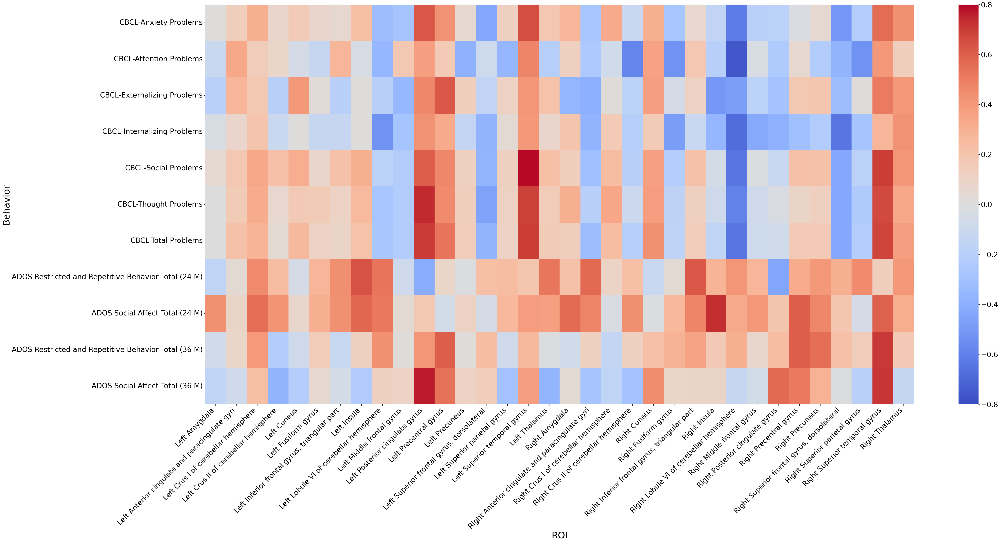

In [54]:
print("Prototype 1")
sns.set_context("notebook", font_scale=1.75, rc={"axes.labelsize": 36,
                                                "axes.titlesize":32,
                                                'axes.labelweight':'bold',
                                                'xtick.labelsize': 28,
                                                'ytick.labelsize': 28
                                               })
fig, axs = plt.subplots(1,1, figsize=(60,30))
relevant_behaviors_prt_1 = corrmatrix_prt_1.loc[behavior_cols].mean(1).dropna().index
m_prt_1 = corrmatrix_prt_1.rename(index=behavior_column_map)
sns.heatmap(m_prt_1, cmap='coolwarm', vmin=-0.8, vmax=0.8, ax=axs, annot=False)
# axs.set_title(f"Correlation Matrix")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Behavior")
plt.xlabel("ROI")
plt.tight_layout()
# plt.savefig('figures/full_corrmatrix.pdf', dpi=150)

Prototype 2


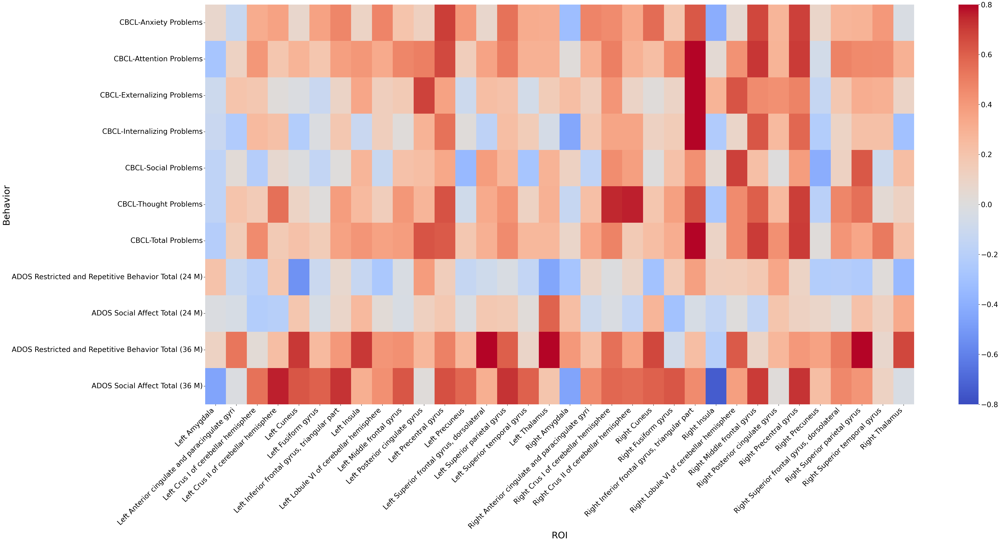

In [55]:
print("Prototype 2")
sns.set_context("notebook", font_scale=1.75, rc={"axes.labelsize": 36,
                                                "axes.titlesize":32,
                                                'axes.labelweight':'bold',
                                                'xtick.labelsize': 28,
                                                'ytick.labelsize': 28
                                               })
fig, axs = plt.subplots(1,1, figsize=(60,30))
relevant_behaviors_prt_2 = corrmatrix_prt_2.loc[behavior_cols].mean(1).dropna().index
m_prt_2 = corrmatrix_prt_2.rename(index=behavior_column_map)
sns.heatmap(m_prt_2, cmap='coolwarm', vmin=-0.8, vmax=0.8, ax=axs, annot=False)
# axs.set_title(f"Correlation Matrix")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Behavior")
plt.xlabel("ROI")
plt.tight_layout()
# plt.savefig('figures/full_corrmatrix.pdf', dpi=150)

### p-value Matrix

In [56]:
sigcorrdf_prt_1['p-value'].dropna().quantile([0.01, 0.1])

0.01    0.022696
0.10    0.093851
Name: p-value, dtype: float64

In [57]:
sigcorrdf_prt_2['p-value'].dropna().quantile([0.01, 0.1])

0.01    0.013833
0.10    0.091575
Name: p-value, dtype: float64

Prototype 1


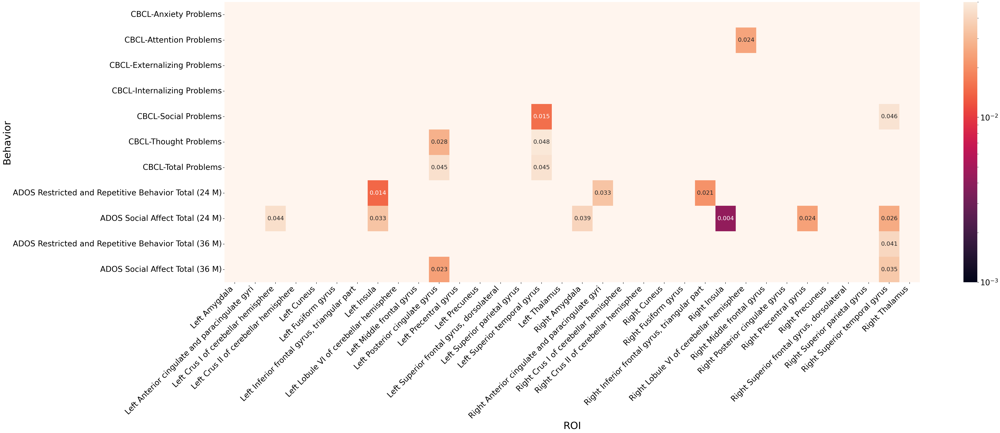

In [58]:
print("Prototype 1")
fig, axs = plt.subplots(1,1, figsize=(55,22))
pmax = thresh = FIVE_PERCENT #ONE_PERCENT
pmin = 0.001
log_norm = LogNorm(vmin=pmin, vmax=pmax)
#mp = pmatrix.loc[relevant_behaviors, relevant_rois].rename(index=behavior_column_map)
mp_prt_1 = pmatrix_prt_1.rename(index=behavior_column_map)
significant_ps_prt_1 = mp_prt_1 < thresh

sns.heatmap(mp_prt_1, ax=axs, annot=True,
            fmt=".3f",
            norm=log_norm,
            mask=~significant_ps_prt_1,
#             vmin=0.001, vmax=0.1,
            cmap='rocket', 
            #cbar_kws={'ticks': [0.001, 0.005, 0.01, 0.05, 0.1]
            # , 'extend':'max'}
           )
# sns.heatmap(pmatrix[significant_ps].loc[relevant_behaviors, relevant_rois], ax=axs, annot=False)
axs.set_facecolor("seashell")
# axs.set_title(f"Raw p-values below {thresh}")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Behavior")
plt.xlabel("ROI")
plt.tight_layout()
# plt.savefig('figures/pmatrix.pdf', dpi=150)
# plt.close()

Prototype 2


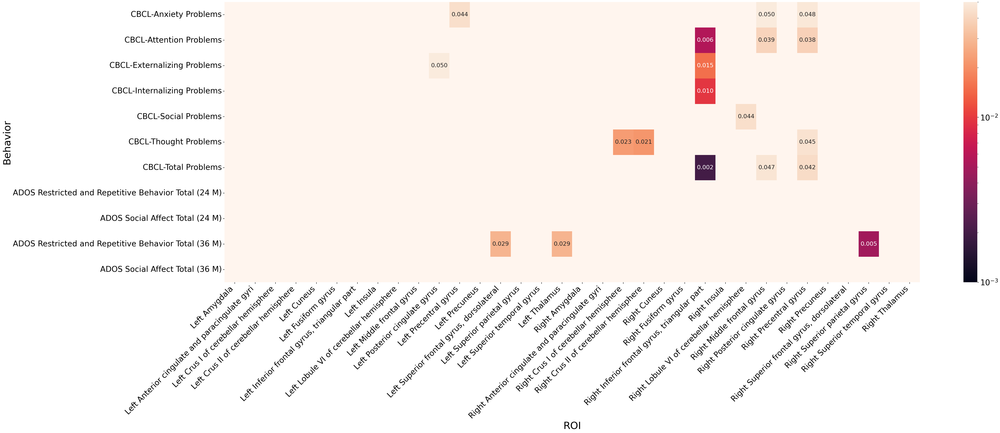

In [59]:
print("Prototype 2")
fig, axs = plt.subplots(1,1, figsize=(55,22))
pmax = thresh = FIVE_PERCENT #ONE_PERCENT
pmin = 0.001
log_norm = LogNorm(vmin=pmin, vmax=pmax)
#mp = pmatrix.loc[relevant_behaviors, relevant_rois].rename(index=behavior_column_map)
mp_prt_2 = pmatrix_prt_2.rename(index=behavior_column_map)
significant_ps_prt_2 = mp_prt_2 < thresh

sns.heatmap(mp_prt_2, ax=axs, annot=True,
            fmt=".3f",
            norm=log_norm,
            mask=~significant_ps_prt_2,
#             vmin=0.001, vmax=0.1,
            cmap='rocket', 
            #cbar_kws={'ticks': [0.001, 0.005, 0.01, 0.05, 0.1]
            # , 'extend':'max'}
           )
# sns.heatmap(pmatrix[significant_ps].loc[relevant_behaviors, relevant_rois], ax=axs, annot=False)
axs.set_facecolor("seashell")
# axs.set_title(f"Raw p-values below {thresh}")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Behavior")
plt.xlabel("ROI")
plt.tight_layout()
# plt.savefig('figures/pmatrix.pdf', dpi=150)
# plt.close()

Prototype 1


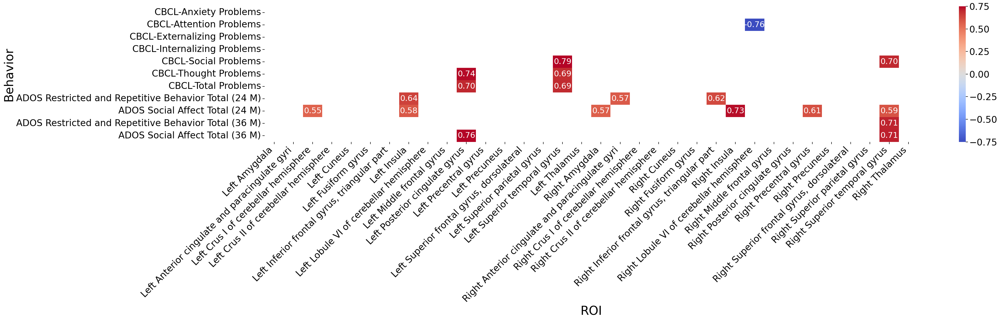

In [60]:
print("Prototype 1")
sns.set_context("notebook", font_scale=1.75, rc={"axes.labelsize": 32,
                                                "axes.titlesize":32,
                                                'axes.labelweight':'bold',
                                                'xtick.labelsize': 24,
                                                'ytick.labelsize': 24
                                               })
fig, axs = plt.subplots(1,1, figsize=(40,12))


significant_correlation_prt_1 = pmatrix_prt_1 < FIVE_PERCENT * 1
relcorrs = sigcorrdf_prt_1[sigcorrdf_prt_1['p-value'] < FIVE_PERCENT *  1]

relevant_behaviors, relevant_rois = relcorrs['Behavior'].unique(), relcorrs['ROI'].unique()
relevant_behaviors.sort()
m_sig_corr_prt_1 = corrmatrix_prt_1[significant_correlation_prt_1].rename(index=behavior_column_map)

sns.heatmap(m_sig_corr_prt_1, cmap='coolwarm', vmin=-0.75, vmax=0.75, ax=axs, annot=True, fmt='.2f',)
# axs.set_title(f"Raw p-values below {thresh}")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Behavior")
plt.xlabel("ROI")
plt.tight_layout()
# plt.savefig('figures/fivep-sig-correlation-heatmap.pdf', dpi=150)

Prototype 2


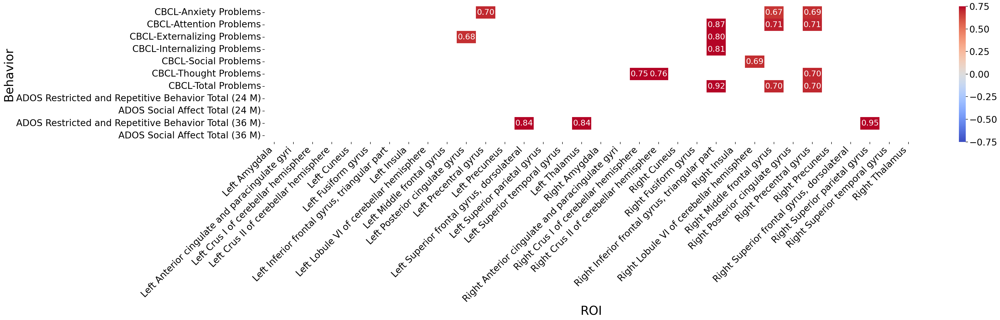

In [61]:
print("Prototype 2")
sns.set_context("notebook", font_scale=1.75, rc={"axes.labelsize": 32,
                                                "axes.titlesize":32,
                                                'axes.labelweight':'bold',
                                                'xtick.labelsize': 24,
                                                'ytick.labelsize': 24
                                               })
fig, axs = plt.subplots(1,1, figsize=(40,12))


significant_correlation_prt_2 = pmatrix_prt_2 < FIVE_PERCENT * 1
relcorrs = sigcorrdf_prt_2[sigcorrdf_prt_2['p-value'] < FIVE_PERCENT *  1]

relevant_behaviors, relevant_rois = relcorrs['Behavior'].unique(), relcorrs['ROI'].unique()
relevant_behaviors.sort()
m_sig_corr_prt_2 = corrmatrix_prt_2[significant_correlation_prt_2].rename(index=behavior_column_map) 

sns.heatmap(m_sig_corr_prt_2, cmap='coolwarm', vmin=-0.75, vmax=0.75, ax=axs, annot=True, fmt='.2f',)
# axs.set_title(f"Raw p-values below {thresh}")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Behavior")
plt.xlabel("ROI")
plt.tight_layout()
# plt.savefig('figures/fivep-sig-correlation-heatmap.pdf', dpi=150)

Prototype 1


374

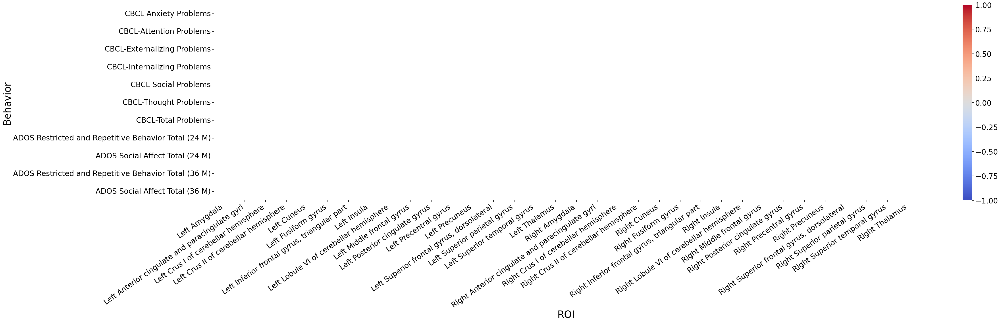

In [62]:
print("Prototype 1")
fig, axs = plt.subplots(1,1, figsize=(50,15))
# sns.heatmap(corrmatrix, cmap='coolwarm', vmin=-1, vmax=1, ax=axs[0])
# axs[0].set_xticks([])
thresh = TEN_PERCENT * 6
relcorrs_prt_1 = sigcorrdf_prt_1[sigcorrdf_prt_1['adjusted-p'] < thresh]
relevant_behaviors, relevant_rois = relcorrs['Behavior'].unique(), relcorrs['ROI'].unique()
mm_prt_1 = corrmatrix_prt_1[corrected_pmatrix_prt_1 < thresh].rename(index=behavior_column_map)
sns.heatmap(mm_prt_1,
            annot=True,
            cmap='coolwarm', vmin=-1, vmax=1, ax=axs,)
plt.xticks(rotation=35, ha='right')
plt.ylabel("Behavior")
plt.xlabel("ROI")
plt.tight_layout()
# plt.savefig('figures/corrected_sig_roi_corrs.pdf', dpi=150)
mm_prt_1.size

Prototype 2


374

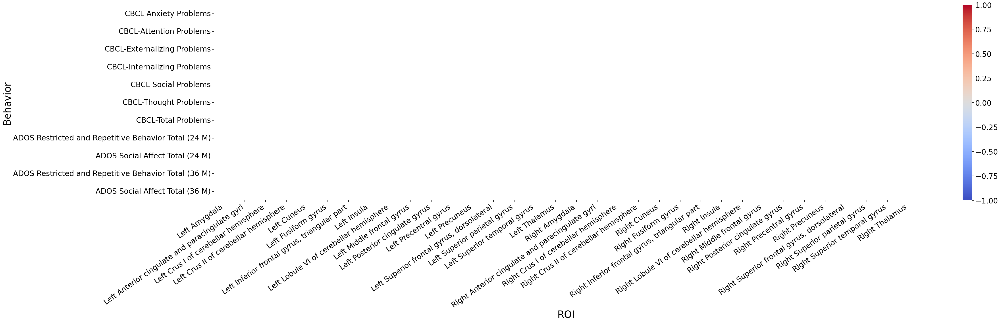

In [63]:
print("Prototype 2")
fig, axs = plt.subplots(1,1, figsize=(50,15))
thresh = TEN_PERCENT * 6
relcorrs_prt_2 = sigcorrdf_prt_2[sigcorrdf_prt_2['adjusted-p'] < thresh]
relevant_behaviors, relevant_rois = relcorrs['Behavior'].unique(), relcorrs['ROI'].unique()
mm_prt_2 = corrmatrix_prt_2[corrected_pmatrix_prt_2 < thresh].rename(index=behavior_column_map)#.loc[relevant_behaviors, relevant_rois] # SAME AS PREVIOUS CELL
sns.heatmap(mm_prt_2,
            annot=True,
            cmap='coolwarm', vmin=-1, vmax=1, ax=axs,)
# axs.set_title(f"Significant Correlations (corrected-p < {TEN_PERCENT})", pad=20)
plt.xticks(rotation=35, ha='right')
plt.ylabel("Behavior")
plt.xlabel("ROI")
plt.tight_layout()
# plt.savefig('figures/corrected_sig_roi_corrs.pdf', dpi=150)
mm_prt_2.size

In [64]:
mm_prt_1.loc[:,'Left Cuneus'].sort_values()

Behavior
CBCL-Anxiety Problems                                  NaN
CBCL-Attention Problems                                NaN
CBCL-Externalizing Problems                            NaN
CBCL-Internalizing Problems                            NaN
CBCL-Social Problems                                   NaN
CBCL-Thought Problems                                  NaN
CBCL-Total Problems                                    NaN
ADOS Restricted and Repetitive Behavior Total (24 M)   NaN
ADOS Social Affect Total (24 M)                        NaN
ADOS Restricted and Repetitive Behavior Total (36 M)   NaN
ADOS Social Affect Total (36 M)                        NaN
Name: Left Cuneus, dtype: float64

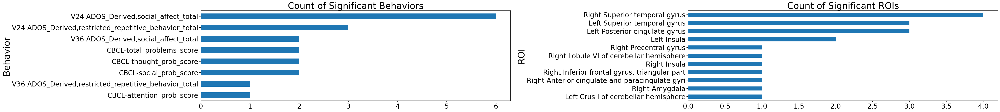

In [65]:
fig, axs = plt.subplots(1,2, figsize=(50,6))

thresh = 0.05
relcorrs = sigcorrdf_prt_1[sigcorrdf_prt_1['p-value'] < thresh]
relcorrs.groupby('Behavior')['ROI'].count().sort_values(ascending=True).plot(kind='barh', ax=axs[0])

axs[0].set_title(f"Count of Significant Behaviors")
# plt.xticks(rotation=45, ha='right');

relcorrs.groupby('ROI')['Behavior'].count().sort_values(ascending=True).plot(kind='barh', ax=axs[1])
axs[1].set_title(f"Count of Significant ROIs")
# axs[1].set_xticks(rotation=45, ha='right');
plt.tight_layout()
# plt.title("Number Behavior/ROIs in a Significant Pair")

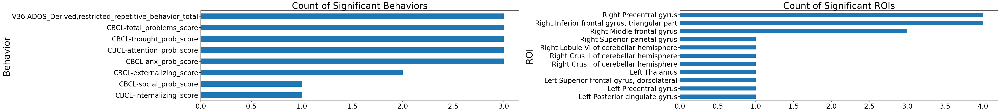

In [66]:
fig, axs = plt.subplots(1,2, figsize=(50,6))

thresh = 0.05
relcorrs = sigcorrdf_prt_2[sigcorrdf_prt_2['p-value'] < thresh]
relcorrs.groupby('Behavior')['ROI'].count().sort_values(ascending=True).plot(kind='barh', ax=axs[0])

axs[0].set_title(f"Count of Significant Behaviors")
# plt.xticks(rotation=45, ha='right');

relcorrs.groupby('ROI')['Behavior'].count().sort_values(ascending=True).plot(kind='barh', ax=axs[1])
axs[1].set_title(f"Count of Significant ROIs")
# axs[1].set_xticks(rotation=45, ha='right');
plt.tight_layout()
# plt.title("Number Behavior/ROIs in a Significant Pair")

In [67]:
mmt_prt_1 = m_sig_corr_prt_1.rename(index=behavior_column_map_inv)
mmt_prt_2 = m_sig_corr_prt_2.rename(index=behavior_column_map_inv)

In [68]:
PATH_prototypes_hier = "ghsom_outputs/bmus/asd_prototypes_ghsom_4x4_leaf_v08_hier.csv"

In [69]:
asd_prototypes_hier = pd.read_csv(PATH_prototypes_hier,index_col=0)

In [70]:
asd_prototypes_hier

,Input Index,Position List,Identifier,Input Label,Label Name,BMU Distance
15,177,"[(0, 3), (6, 0)]",IBIS110925,4,ASD,2.409018
16,222,"[(0, 3), (6, 0)]",IBIS688878,4,ASD,2.215053
25,183,"[(0, 2), (3, 2)]",IBIS160209,4,ASD,1.386925
26,209,"[(3, 0), (1, 0)]",IBIS544847,4,ASD,1.605376
27,230,"[(3, 0), (1, 1)]",IBIS841812,4,ASD,2.399711
...,...,...,...,...,...,...
220,179,"[(2, 3), (4, 3)]",IBIS152174,4,ASD,1.405726
224,196,"[(1, 3), (1, 2)]",IBIS389521,4,ASD,1.473205
234,174,"[(1, 3), (2, 4)]",IBIS903923,4,ASD,1.210366
235,208,"[(1, 3), (2, 4)]",IBIS515353,4,ASD,1.027546


In [71]:
asd_prototypes_hier.shape

(65, 6)

In [72]:
asd_prototypes_hier = asd_prototypes_hier[asd_prototypes_hier['Identifier'].isin(intersection_ids)]

In [73]:
asd_prototypes_hier.shape

(54, 6)

/tmp/ipykernel_466416/1318818043.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))
/tmp/ipykernel_466416/1318818043.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))


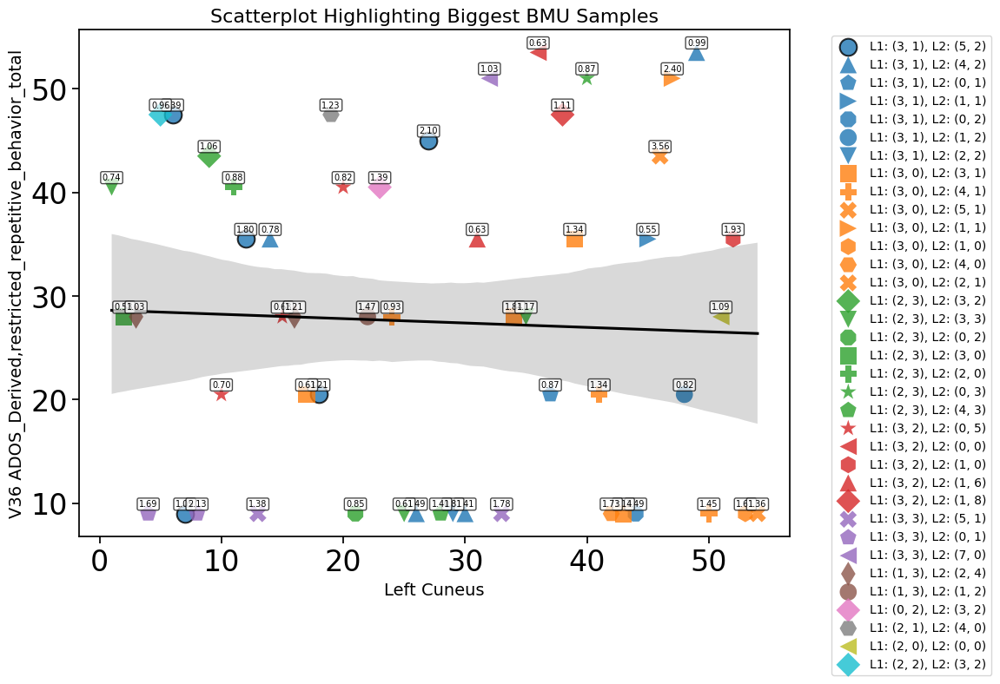

Spearman Correlation: -0.0430118847047359
P-value: 0.7574594041443699


In [74]:
# Filter valid rows for the behavior score
roi, bhv = "Left Cuneus", "V36 ADOS_Derived,restricted_repetitive_behavior_total"

# Parse the Position List into Level 1 and Level 2
def parse_position_list(position_list_str):
    eval_list = eval(position_list_str)  # Convert string to list of tuples
    return eval_list[0], eval_list[1] if len(eval_list) > 1 else (None, None)

# Add hierarchy information from asd_prototypes_hier to rowdf
asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))
hierarchy_info = asd_prototypes_hier[['Identifier', 'Level 1', 'Level 2', 'Position List', 'BMU Distance']]
rowdf = pd.merge(datadf_asd_prototypes, hierarchy_info, left_on='ID', right_on='Identifier', how='left')

# Sort Level 1 and Level 2 based on their counts
level1_counts = rowdf['Level 1'].value_counts()
level2_counts = rowdf['Level 2'].value_counts()

# Sort by count and reorder
rowdf['Level 1'] = pd.Categorical(rowdf['Level 1'], categories=level1_counts.index, ordered=True)
rowdf['Level 2'] = pd.Categorical(rowdf['Level 2'], categories=level2_counts.index, ordered=True)

# Identify the biggest BMU
biggest_bmu = asd_prototypes_hier['Position List'].value_counts().idxmax()

m_ = rowdf[bhv] > -20
rowdf = rowdf[m_]

# Add a column indicating whether a sample belongs to the biggest BMU
rowdf['Highlight'] = rowdf['Position List'] == biggest_bmu

# Rank data for Spearman correlation
rowdf[[roi, bhv]] = rowdf[[roi, bhv]].apply(rankdata)

# Assign colors for Level 1 and markers for Level 2
palette = sns.color_palette("tab10", n_colors=10)
level1_colors = {level1: palette[i] for i, level1 in enumerate(level1_counts.index)}

# Updated marker list with at least 16 options
markers = ['o', 's', '^', 'D', 'P', 'X', 'v', '*', 'p', '<', '>', 'h', 'H', 'd', '8']
level2_markers = {level2: markers[i % len(markers)] for i, level2 in enumerate(level2_counts.index)}

# Plot with hierarchy-based colors and markers
plt.figure(figsize=(12, 8))
for level1 in level1_counts.index:
    subset = rowdf[rowdf['Level 1'] == level1]
    for level2 in level2_counts.index:
        sub_subset = subset[subset['Level 2'] == level2]
        if sub_subset.empty:
            continue
        # Define marker edge color based on whether the sample is in the biggest BMU
        edgecolor = 'black' if sub_subset['Highlight'].any() else 'none'
        plt.scatter(
            sub_subset[roi],
            sub_subset[bhv],
            label=f"L1: {level1}, L2: {level2}",
            color=level1_colors[level1],
            marker=level2_markers[level2],
            s=200,
            alpha=0.8,
            edgecolor=edgecolor,  # Highlight samples from the biggest BMU
            linewidth=1.5
        )
        # Add smaller annotations for BMU Distance with boxes
        for i, point in sub_subset.iterrows():
            plt.text(
                point[roi], point[bhv] + 0.5,  # Adjust placement slightly above each point
                f"{point['BMU Distance']:.2f}",
                fontsize=7,  # Reduced font size
                ha='center',
                va='bottom',
                bbox=dict(boxstyle="round,pad=0.2", edgecolor='black', facecolor='white', alpha=0.7)
            )

# Add regression line
sns.regplot(x=roi, y=bhv, data=rowdf, scatter=False, color="black")
plt.xlabel(roi, fontsize=14)
plt.ylabel(bhv, fontsize=14)
plt.title("Scatterplot Highlighting Biggest BMU Samples", fontsize=16)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

# Calculate Spearman correlation
correlation, pvalue = spearmanr(rowdf[roi], rowdf[bhv])
print("Spearman Correlation:", correlation)
print("P-value:", pvalue)

In [75]:
len(asd_prototypes_hier)

54

Total number of significant correlations: 19


/tmp/ipykernel_466416/342503816.py:5: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  significant_pairs = mmt_prt_1.stack(dropna=True).reset_index()
/tmp/ipykernel_466416/342503816.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))


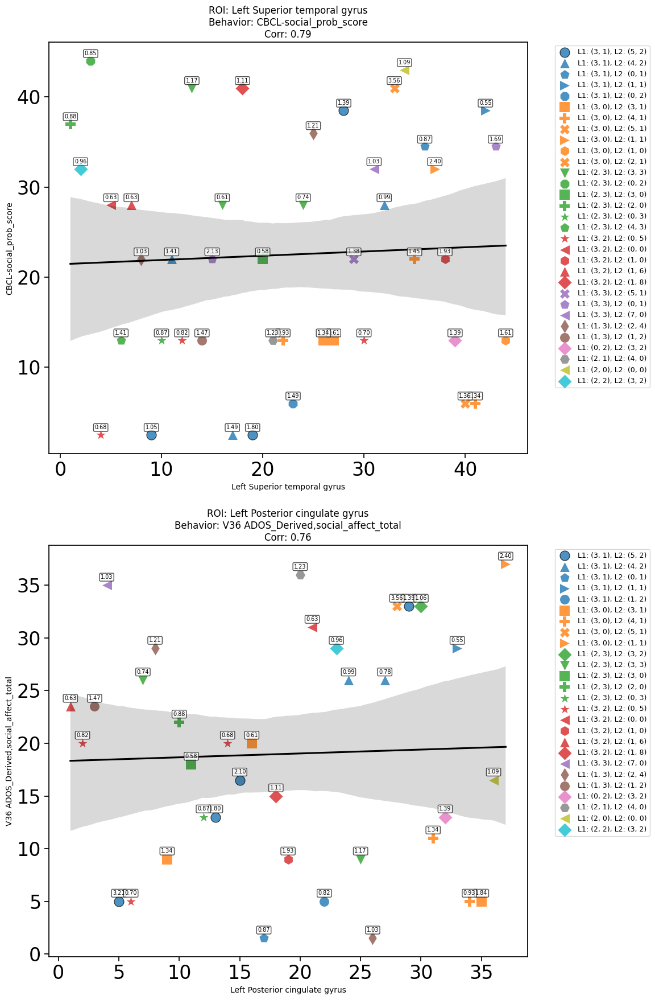

Total significant correlations: 19


In [76]:
# Parameters: Adjust the number of top correlations to plot
top_n = 2  # Adjust this to change the number of scatter plots

# Filter significant correlations from the matrix `mmt`
significant_pairs = mmt_prt_1.stack(dropna=True).reset_index()
significant_pairs.columns = ['Behavior', 'ROI', 'Correlation']

# Sort by absolute correlation values
significant_pairs['abs_corr'] = significant_pairs['Correlation'].abs()
sorted_pairs = significant_pairs.sort_values(by='abs_corr', ascending=False)

# Total number of significant correlations
total_combinations = len(sorted_pairs)
print(f"Total number of significant correlations: {total_combinations}")

# Get the top N correlations
top_pairs = sorted_pairs.head(top_n)

# Updated marker list with 15 unique options
markers = ['o', 's', '^', 'D', 'P', 'X', 'v', '*', 'p', '<', '>', 'h', 'H', 'd', '8']

# Parse the Position List into Level 1 and Level 2
def parse_position_list(position_list_str):
    eval_list = eval(position_list_str)  # Convert string to list of tuples
    return eval_list[0], eval_list[1] if len(eval_list) > 1 else (None, None)

# Add hierarchy information from asd_prototypes_hier to rowdf
asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))
hierarchy_info = asd_prototypes_hier[['Identifier', 'Level 1', 'Level 2', 'Position List', 'BMU Distance']]
rowdf = pd.merge(datadf_asd_prototypes, hierarchy_info, left_on='ID', right_on='Identifier', how='left')

# Sort Level 1 and Level 2 based on their counts
level1_counts = rowdf['Level 1'].value_counts()
level2_counts = rowdf['Level 2'].value_counts()

# Sort by count and reorder
rowdf['Level 1'] = pd.Categorical(rowdf['Level 1'], categories=level1_counts.index, ordered=True)
rowdf['Level 2'] = pd.Categorical(rowdf['Level 2'], categories=level2_counts.index, ordered=True)

# Assign colors for Level 1 and markers for Level 2
palette = sns.color_palette("tab10", n_colors=10)
level1_colors = {level1: palette[i] for i, level1 in enumerate(level1_counts.index)}
level2_markers = {level2: markers[i % len(markers)] for i, level2 in enumerate(level2_counts.index)}

# Plot each pair in separate scatter plots (vertically)
fig, axes = plt.subplots(top_n, 1, figsize=(12, 9 * top_n))
if top_n == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one plot

for ax, row in zip(axes, top_pairs.itertuples(index=False)):
    behavior, roi, corr = row.Behavior, row.ROI, row.Correlation
    
    # Prepare the data for the scatter plot
    pair_df = rowdf.copy()
    m = pair_df[behavior] > -1
    pair_df = pair_df[m]
    pair_df[[roi, behavior]] = pair_df[[roi, behavior]].apply(rankdata)
    
    # Plot with hierarchy-based colors and markers
    for level1 in level1_counts.index:
        subset = pair_df[pair_df['Level 1'] == level1]
        for level2 in level2_counts.index:
            sub_subset = subset[subset['Level 2'] == level2]
            if sub_subset.empty:
                continue
            # Only apply edge color to biggest BMU samples
            edgecolor = 'black' if sub_subset['Position List'].iloc[0] == asd_prototypes_hier['Position List'].value_counts().idxmax() else None
            ax.scatter(
                sub_subset[roi],
                sub_subset[behavior],
                label=f"L1: {level1}, L2: {level2}",
                color=level1_colors[level1],
                marker=level2_markers[level2],
                s=150,
                alpha=0.8,
                edgecolor=edgecolor,  # Highlight samples if they are in the biggest BMU
                linewidth=0.8 if edgecolor else 0  # No edge for non-biggest BMU samples
            )
            # Annotate BMU distances
            for i, point in sub_subset.iterrows():
                ax.text(
                    point[roi], point[behavior] + 0.5,
                    f"{point['BMU Distance']:.2f}",
                    fontsize=7,
                    ha='center',
                    va='bottom',
                    bbox=dict(boxstyle="round,pad=0.2", edgecolor='black', facecolor='white', alpha=0.7)
                )

    # Add regression line
    sns.regplot(x=roi, y=behavior, data=pair_df, scatter=False, color='black', ax=ax)

    # Add titles and labels
    ax.set_title(f"ROI: {roi}\nBehavior: {behavior}\nCorr: {corr:.2f}", fontsize=12)
    ax.set_xlabel(roi, fontsize=10)
    ax.set_ylabel(behavior, fontsize=10)

    # Add legend
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

# Print the total combinations for reference
print(f"Total significant correlations: {total_combinations}")

Total number of significant correlations: 19


/tmp/ipykernel_466416/1666552315.py:12: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  significant_pairs = mmt_prt_1.stack(dropna=True).reset_index()
/tmp/ipykernel_466416/1666552315.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))


Total 54
1st prototype 9
2nd prototype 9


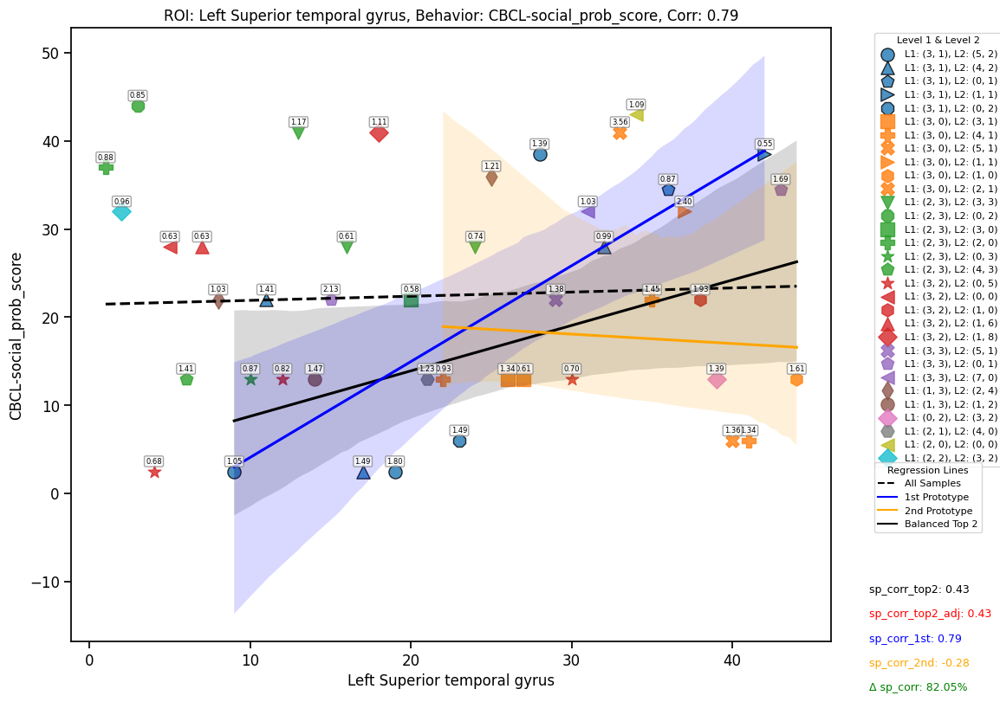

In [77]:
from matplotlib.lines import Line2D
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import spearmanr, rankdata


# Parameters: Adjust the number of top correlations to plot
top_n = 1 if total_combinations > 1 else total_combinations  # Adjust this to change the number of scatter plots

# Filter significant correlations from the matrix `mmt`
significant_pairs = mmt_prt_1.stack(dropna=True).reset_index()
significant_pairs.columns = ['Behavior', 'ROI', 'Correlation']

# Sort by absolute correlation values
significant_pairs['abs_corr'] = significant_pairs['Correlation'].abs()
sorted_pairs = significant_pairs.sort_values(by='abs_corr', ascending=False)

# Total number of significant correlations
total_combinations = len(sorted_pairs)
print(f"Total number of significant correlations: {total_combinations}")

# Get the top N correlations
top_pairs = sorted_pairs.head(top_n)

# Updated marker list with 15 unique options
markers = ['o', 's', '^', 'D', 'P', 'X', 'v', '*', 'p', '<', '>', 'h', 'H', 'd', '8']

# Parse the Position List into Level 1 and Level 2
def parse_position_list(position_list_str):
    eval_list = eval(position_list_str)  # Convert string to list of tuples
    return eval_list[0], eval_list[1] if len(eval_list) > 1 else (None, None)

# Add hierarchy information from ds_prototypes_hier to dssamples
asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))
hierarchy_info = asd_prototypes_hier[['Identifier', 'Level 1', 'Level 2', 'Position List', 'BMU Distance']]
rowdf = pd.merge(datadf_asd_prototypes, hierarchy_info, left_on='ID', right_on='Identifier', how='left')

# Sort Level 1 and Level 2 based on their counts
level1_counts = rowdf['Level 1'].value_counts()
level2_counts = rowdf['Level 2'].value_counts()

# Sort by count and reorder
rowdf['Level 1'] = pd.Categorical(rowdf['Level 1'], categories=level1_counts.index, ordered=True)
rowdf['Level 2'] = pd.Categorical(rowdf['Level 2'], categories=level2_counts.index, ordered=True)

# Assign colors for Level 1 and markers for Level 2
palette = sns.color_palette("tab10", n_colors=10)
level1_colors = {level1: palette[i % len(palette)] for i, level1 in enumerate(level1_counts.index)}
level2_markers = {level2: markers[i % len(markers)] for i, level2 in enumerate(level2_counts.index)}

# Plot each pair in separate scatter plots (vertically)
fig, axes = plt.subplots(top_n, 1, figsize=(12, 8.5 * top_n))
if top_n == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one plot

for ax, row in zip(axes, top_pairs.itertuples(index=False)):
    behavior, roi, corr = row.Behavior, row.ROI, row.Correlation

    # Prepare the data for the scatter plot
    pair_df = rowdf.copy()
    m = pair_df[behavior] > -1
    pair_df = pair_df[m]
    pair_df[[roi, behavior]] = pair_df[[roi, behavior]].apply(rankdata)

    # Identify the biggest 2 prototypes
    top_level1_values = pair_df['Level 1'].value_counts().head(2).index
    blue_samples = pair_df[pair_df['Level 1'] == top_level1_values[0]]
    orange_samples = pair_df[pair_df['Level 1'] == top_level1_values[1]]

    # Combine the two biggest prototypes for sp_corr_top2
    top2_samples = pd.concat([blue_samples, orange_samples])

    # Oversample orange samples to match the size of blue samples
    oversampled_orange_samples = pd.concat([orange_samples, orange_samples.sample(n=len(blue_samples) - len(orange_samples), replace=True)])
    balanced_samples = pd.concat([blue_samples, oversampled_orange_samples])

    # Plot with hierarchy-based colors and markers
    scatter_handles = []
    for level1 in level1_counts.index:
        subset = pair_df[pair_df['Level 1'] == level1]
        for level2 in level2_counts.index:
            sub_subset = subset[subset['Level 2'] == level2]
            if sub_subset.empty:
                continue
            # Highlight the biggest prototype
            edgecolor = 'black' if level1 == top_level1_values[0] else None
            scatter = ax.scatter(
                sub_subset[roi],
                sub_subset[behavior],
                label=f"L1: {level1}, L2: {level2}",
                color=level1_colors[level1],
                marker=level2_markers[level2],
                s=120,
                alpha=0.8,
                edgecolor=edgecolor
            )
            scatter_handles.append(scatter)

            # Annotate BMU distances
            for _, point in sub_subset.iterrows():
                ax.text(
                    point[roi],
                    point[behavior] + 0.7,  # Adjust offset for clarity
                    f"{point['BMU Distance']:.2f}",
                    fontsize=6,
                    ha='center',
                    va='bottom',
                    bbox=dict(boxstyle="round,pad=0.2", edgecolor='gray', facecolor='white', alpha=0.7)
                )

    # Add regression lines
    sns.regplot(x=roi, y=behavior, data=pair_df, scatter=False, color='black', ax=ax, line_kws={"linestyle": "--"}, truncate=True, ci=None)
    sns.regplot(x=roi, y=behavior, data=balanced_samples, scatter=False, color='black', ax=ax, line_kws={"linestyle": "-"}, truncate=True)
    sns.regplot(x=roi, y=behavior, data=blue_samples, scatter=False, color='blue', ax=ax, line_kws={"linestyle": "-"}, truncate=True)
    sns.regplot(x=roi, y=behavior, data=orange_samples, scatter=False, color='orange', ax=ax, line_kws={"linestyle": "-"}, truncate=True)

    # Calculate correlations
    sp_corr_blue, _ = spearmanr(blue_samples[roi], blue_samples[behavior])
    sp_corr_orange, _ = spearmanr(orange_samples[roi], orange_samples[behavior])
    sp_corr_top2, _ = spearmanr(top2_samples[roi], top2_samples[behavior])  # Without oversampling
    sp_corr_top2_adj, _ = spearmanr(balanced_samples[roi], balanced_samples[behavior])  # With oversampling

    # Calculate delta_corr (percentage change)
    delta_corr = (sp_corr_blue - sp_corr_top2_adj) / sp_corr_top2_adj

    # Add correlation values to the plot
    ii = 0.12
    ll = 0.04
    # Add colored correlation values below regression legend
    #ax.text(1.05, ii, f"sp_corr: {corr:.2f}", transform=ax.transAxes, fontsize=9, color="black")
    ax.text(1.05, ii-ll, f"sp_corr_top2: {sp_corr_top2:.2f}", transform=ax.transAxes, fontsize=9, color="black")
    ax.text(1.05, ii-2*ll, f"sp_corr_top2_adj: {sp_corr_top2_adj:.2f}", transform=ax.transAxes, fontsize=9, color="red")
    ax.text(1.05, ii-3*ll, f"sp_corr_1st: {sp_corr_blue:.2f}", transform=ax.transAxes, fontsize=9, color="blue")
    ax.text(1.05, ii-4*ll, f"sp_corr_2nd: {sp_corr_orange:.2f}", transform=ax.transAxes, fontsize=9, color="orange")
    ax.text(1.05, ii-5*ll, f"\u0394 sp_corr: {delta_corr:.2%}", transform=ax.transAxes, fontsize=9, color="green")

    # Add scatter legend
    scatter_legend = ax.legend(
        handles=scatter_handles,
        title="Level 1 & Level 2",
        title_fontsize=8,  # Match font size with legend text
        bbox_to_anchor=(1.05, 1),
        loc='upper left',
        fontsize=8
    )
    ax.add_artist(scatter_legend)

    # Add regression legend
    reg_legend_handles = [
        Line2D([0], [0], color='black', linestyle="--", label="All Samples"),
        Line2D([0], [0], color='blue', linestyle="-", label="1st Prototype"),
        Line2D([0], [0], color='orange', linestyle="-", label="2nd Prototype"),
        Line2D([0], [0], color='black', linestyle="-", label="Balanced Top 2")
    ]
    ax.legend(
        handles=reg_legend_handles,
        title="Regression Lines",
        title_fontsize=8,  # Match font size with legend text
        bbox_to_anchor=(1.05, 0.3),
        loc='upper left',
        fontsize=8
    )

    # Add title
    ax.set_title(f"ROI: {roi}, Behavior: {behavior}, Corr: {corr:.2f}", fontsize=12)

    # Adjust font size for x and y labels
    ax.set_xlabel(roi, fontsize=12)
    ax.set_ylabel(behavior, fontsize=12)

    # Adjust tick label size
    ax.tick_params(axis='both', which='major', labelsize=12)

print("Total",len(asd_prototypes_hier))
print("1st prototype",len(blue_samples))
print("2nd prototype",len(orange_samples))

# Adjust layout and show the plots
plt.tight_layout()
plt.subplots_adjust()
plt.show()

## sss

/tmp/ipykernel_466416/3085247700.py:12: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  significant_pairs = mmt_prt_2.stack(dropna=True).reset_index()
/tmp/ipykernel_466416/3085247700.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))


Total number of significant correlations: 19
Total 54
1st prototype 9
2nd prototype 9


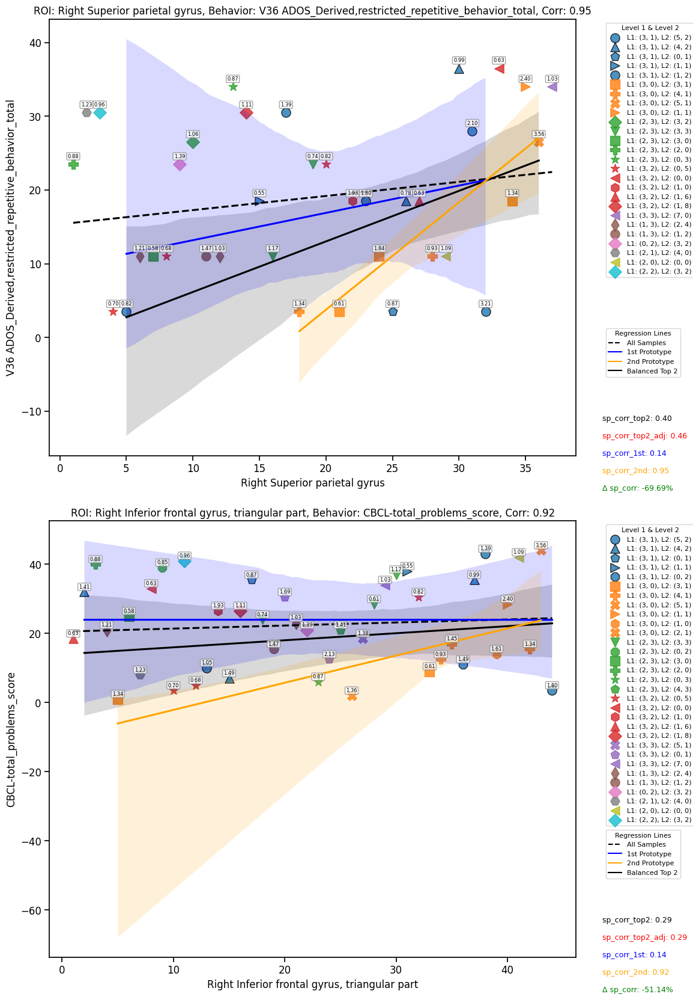

In [78]:
from matplotlib.lines import Line2D
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import spearmanr, rankdata


# Parameters: Adjust the number of top correlations to plot
top_n = 2 if total_combinations > 2 else total_combinations  # Adjust this to change the number of scatter plots

# Filter significant correlations from the matrix `mmt`
significant_pairs = mmt_prt_2.stack(dropna=True).reset_index()
significant_pairs.columns = ['Behavior', 'ROI', 'Correlation']

# Sort by absolute correlation values
significant_pairs['abs_corr'] = significant_pairs['Correlation'].abs()
sorted_pairs = significant_pairs.sort_values(by='abs_corr', ascending=False)

# Total number of significant correlations
total_combinations = len(sorted_pairs)
print(f"Total number of significant correlations: {total_combinations}")

# Get the top N correlations
top_pairs = sorted_pairs.head(top_n)

# Updated marker list with 15 unique options
markers = ['o', 's', '^', 'D', 'P', 'X', 'v', '*', 'p', '<', '>', 'h', 'H', 'd', '8']

# Parse the Position List into Level 1 and Level 2
def parse_position_list(position_list_str):
    eval_list = eval(position_list_str)  # Convert string to list of tuples
    return eval_list[0], eval_list[1] if len(eval_list) > 1 else (None, None)

# Add hierarchy information from ds_prototypes_hier to dssamples
asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))
hierarchy_info = asd_prototypes_hier[['Identifier', 'Level 1', 'Level 2', 'Position List', 'BMU Distance']]
rowdf = pd.merge(datadf_asd_prototypes, hierarchy_info, left_on='ID', right_on='Identifier', how='left')

# Sort Level 1 and Level 2 based on their counts
level1_counts = rowdf['Level 1'].value_counts()
level2_counts = rowdf['Level 2'].value_counts()

# Sort by count and reorder
rowdf['Level 1'] = pd.Categorical(rowdf['Level 1'], categories=level1_counts.index, ordered=True)
rowdf['Level 2'] = pd.Categorical(rowdf['Level 2'], categories=level2_counts.index, ordered=True)

# Assign colors for Level 1 and markers for Level 2
palette = sns.color_palette("tab10", n_colors=10)
level1_colors = {level1: palette[i % len(palette)] for i, level1 in enumerate(level1_counts.index)}
level2_markers = {level2: markers[i % len(markers)] for i, level2 in enumerate(level2_counts.index)}

# Plot each pair in separate scatter plots (vertically)
fig, axes = plt.subplots(top_n, 1, figsize=(12, 8.5 * top_n))
if top_n == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one plot

for ax, row in zip(axes, top_pairs.itertuples(index=False)):
    behavior, roi, corr = row.Behavior, row.ROI, row.Correlation

    # Prepare the data for the scatter plot
    pair_df = rowdf.copy()
    m = pair_df[behavior] > -1
    pair_df = pair_df[m]
    pair_df[[roi, behavior]] = pair_df[[roi, behavior]].apply(rankdata)

    # Identify the biggest 2 prototypes
    top_level1_values = pair_df['Level 1'].value_counts().head(2).index
    blue_samples = pair_df[pair_df['Level 1'] == top_level1_values[0]]
    orange_samples = pair_df[pair_df['Level 1'] == top_level1_values[1]]

    # Combine the two biggest prototypes for sp_corr_top2
    top2_samples = pd.concat([blue_samples, orange_samples])

    # Oversample orange samples to match the size of blue samples
    oversampled_orange_samples = pd.concat([orange_samples, orange_samples.sample(n=len(blue_samples) - len(orange_samples), replace=True)])
    balanced_samples = pd.concat([blue_samples, oversampled_orange_samples])

    # Plot with hierarchy-based colors and markers
    scatter_handles = []
    for level1 in level1_counts.index:
        subset = pair_df[pair_df['Level 1'] == level1]
        for level2 in level2_counts.index:
            sub_subset = subset[subset['Level 2'] == level2]
            if sub_subset.empty:
                continue
            # Highlight the biggest prototype
            edgecolor = 'black' if level1 == top_level1_values[0] else None
            scatter = ax.scatter(
                sub_subset[roi],
                sub_subset[behavior],
                label=f"L1: {level1}, L2: {level2}",
                color=level1_colors[level1],
                marker=level2_markers[level2],
                s=120,
                alpha=0.8,
                edgecolor=edgecolor
            )
            scatter_handles.append(scatter)

            # Annotate BMU distances
            for _, point in sub_subset.iterrows():
                ax.text(
                    point[roi],
                    point[behavior] + 0.7,  # Adjust offset for clarity
                    f"{point['BMU Distance']:.2f}",
                    fontsize=6,
                    ha='center',
                    va='bottom',
                    bbox=dict(boxstyle="round,pad=0.2", edgecolor='gray', facecolor='white', alpha=0.7)
                )

    # Add regression lines
    sns.regplot(x=roi, y=behavior, data=pair_df, scatter=False, color='black', ax=ax, line_kws={"linestyle": "--"}, truncate=True, ci=None)
    sns.regplot(x=roi, y=behavior, data=balanced_samples, scatter=False, color='black', ax=ax, line_kws={"linestyle": "-"}, truncate=True)
    sns.regplot(x=roi, y=behavior, data=blue_samples, scatter=False, color='blue', ax=ax, line_kws={"linestyle": "-"}, truncate=True)
    sns.regplot(x=roi, y=behavior, data=orange_samples, scatter=False, color='orange', ax=ax, line_kws={"linestyle": "-"}, truncate=True)

    # Calculate correlations
    sp_corr_blue, _ = spearmanr(blue_samples[roi], blue_samples[behavior])
    sp_corr_orange, _ = spearmanr(orange_samples[roi], orange_samples[behavior])
    sp_corr_top2, _ = spearmanr(top2_samples[roi], top2_samples[behavior])  # Without oversampling
    sp_corr_top2_adj, _ = spearmanr(balanced_samples[roi], balanced_samples[behavior])  # With oversampling

    # Calculate delta_corr (percentage change)
    delta_corr = (sp_corr_blue - sp_corr_top2_adj) / sp_corr_top2_adj

    # Add correlation values to the plot
    ii = 0.12
    ll = 0.04
    # Add colored correlation values below regression legend
    #ax.text(1.05, ii, f"sp_corr: {corr:.2f}", transform=ax.transAxes, fontsize=9, color="black")
    ax.text(1.05, ii-ll, f"sp_corr_top2: {sp_corr_top2:.2f}", transform=ax.transAxes, fontsize=9, color="black")
    ax.text(1.05, ii-2*ll, f"sp_corr_top2_adj: {sp_corr_top2_adj:.2f}", transform=ax.transAxes, fontsize=9, color="red")
    ax.text(1.05, ii-3*ll, f"sp_corr_1st: {sp_corr_blue:.2f}", transform=ax.transAxes, fontsize=9, color="blue")
    ax.text(1.05, ii-4*ll, f"sp_corr_2nd: {sp_corr_orange:.2f}", transform=ax.transAxes, fontsize=9, color="orange")
    ax.text(1.05, ii-5*ll, f"\u0394 sp_corr: {delta_corr:.2%}", transform=ax.transAxes, fontsize=9, color="green")

    # Add scatter legend
    scatter_legend = ax.legend(
        handles=scatter_handles,
        title="Level 1 & Level 2",
        title_fontsize=8,  # Match font size with legend text
        bbox_to_anchor=(1.05, 1),
        loc='upper left',
        fontsize=8
    )
    ax.add_artist(scatter_legend)

    # Add regression legend
    reg_legend_handles = [
        Line2D([0], [0], color='black', linestyle="--", label="All Samples"),
        Line2D([0], [0], color='blue', linestyle="-", label="1st Prototype"),
        Line2D([0], [0], color='orange', linestyle="-", label="2nd Prototype"),
        Line2D([0], [0], color='black', linestyle="-", label="Balanced Top 2")
    ]
    ax.legend(
        handles=reg_legend_handles,
        title="Regression Lines",
        title_fontsize=8,  # Match font size with legend text
        bbox_to_anchor=(1.05, 0.3),
        loc='upper left',
        fontsize=8
    )

    # Add title
    ax.set_title(f"ROI: {roi}, Behavior: {behavior}, Corr: {corr:.2f}", fontsize=12)

    # Adjust font size for x and y labels
    ax.set_xlabel(roi, fontsize=12)
    ax.set_ylabel(behavior, fontsize=12)

    # Adjust tick label size
    ax.tick_params(axis='both', which='major', labelsize=12)

print("Total",len(asd_prototypes_hier))
print("1st prototype",len(blue_samples))
print("2nd prototype",len(orange_samples))

# Adjust layout and show the plots
plt.tight_layout()
plt.subplots_adjust()
plt.show()

## sss

In [79]:
level1_counts.index

Index([(3, 1), (3, 0), (2, 3), (3, 2), (3, 3), (1, 3), (0, 2), (2, 1), (2, 0),
       (2, 2)],
      dtype='object', name='Level 1')

/tmp/ipykernel_466416/3354261195.py:11: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  significant_pairs = mmt_prt_1.stack(dropna=True).reset_index()
/tmp/ipykernel_466416/3354261195.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))


Total number of significant correlations: 19
Total 54
1st prototype 9
2nd prototype 9


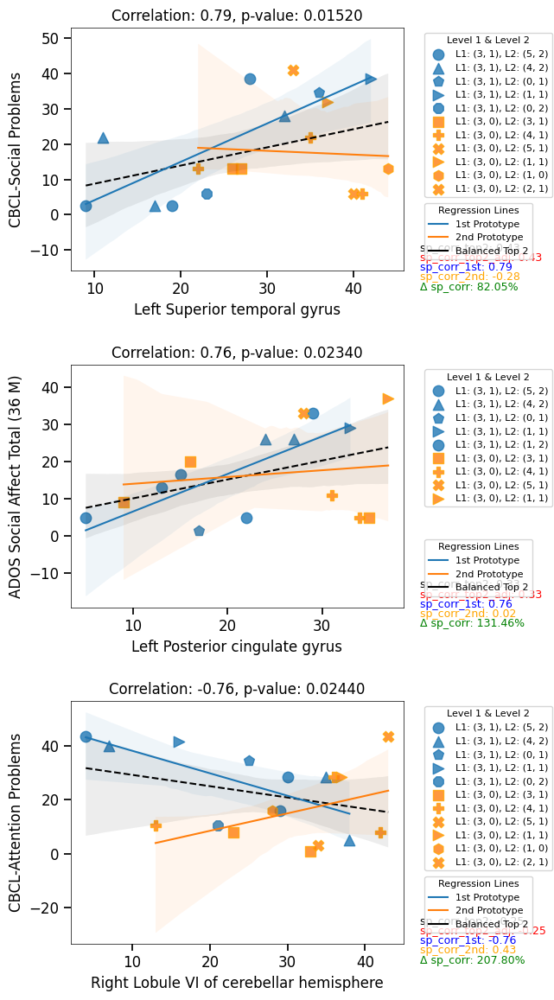

In [80]:
from matplotlib.lines import Line2D
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import spearmanr, rankdata

# Parameters: Adjust the number of top correlations to plot
top_n = 3 if total_combinations > 3 else total_combinations  # Adjust this to change the number of scatter plots

# Filter significant correlations from the matrix `mmt`
significant_pairs = mmt_prt_1.stack(dropna=True).reset_index()
significant_pairs.columns = ['Behavior', 'ROI', 'Correlation']

# Sort by absolute correlation values
significant_pairs['abs_corr'] = significant_pairs['Correlation'].abs()
sorted_pairs = significant_pairs.sort_values(by='abs_corr', ascending=False)

# Total number of significant correlations
total_combinations = len(sorted_pairs)
print(f"Total number of significant correlations: {total_combinations}")

# Retrieve p-values corresponding to the sorted correlation pairs
sorted_pairs['p_value'] = [pmatrix_prt_1.loc[b, r] for b, r in zip(sorted_pairs['Behavior'], sorted_pairs['ROI'])]

# Get the top N correlations
top_pairs = sorted_pairs.head(top_n)

# Updated marker list with 15 unique options
markers = ['o', 's', '^', 'D', 'P', 'X', 'v', '*', 'p', '<', '>', 'h', 'H', 'd', '8']

# Parse the Position List into Level 1 and Level 2
def parse_position_list(position_list_str):
    eval_list = eval(position_list_str)  # Convert string to list of tuples
    return eval_list[0], eval_list[1] if len(eval_list) > 1 else (None, None)

# Add hierarchy information from ds_prototypes_hier to dssamples
asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))
hierarchy_info = asd_prototypes_hier[['Identifier', 'Level 1', 'Level 2', 'Position List', 'BMU Distance']]
rowdf = pd.merge(datadf_asd_prototypes, hierarchy_info, left_on='ID', right_on='Identifier', how='left')

# Sort Level 1 and Level 2 based on their counts
level1_counts = rowdf['Level 1'].value_counts()
level2_counts = rowdf['Level 2'].value_counts()

# Sort by count and reorder
rowdf['Level 1'] = pd.Categorical(rowdf['Level 1'], categories=level1_counts.index, ordered=True)
rowdf['Level 2'] = pd.Categorical(rowdf['Level 2'], categories=level2_counts.index, ordered=True)

# Assign colors for Level 1 and markers for Level 2
palette = sns.color_palette("tab10", n_colors=10)
level1_colors = {level1: palette[i % len(palette)] for i, level1 in enumerate(level1_counts.index)}
level2_markers = {level2: markers[i % len(markers)] for i, level2 in enumerate(level2_counts.index)}

# Plot each pair in separate scatter plots (vertically)
fig, axes = plt.subplots(top_n, 1, figsize=(7, 4 * top_n))
if top_n == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one plot

for ax, row in zip(axes, top_pairs.itertuples(index=False)):
    behavior, roi, corr, p_value = row.Behavior, row.ROI, row.Correlation, row.p_value

    # Prepare the data for the scatter plot
    pair_df = rowdf.copy()
    m = pair_df[behavior] > -1
    pair_df = pair_df[m]
    pair_df[[roi, behavior]] = pair_df[[roi, behavior]].apply(rankdata)

    # Identify the biggest 2 prototypes
    top_level1_values = pair_df['Level 1'].value_counts().head(2).index
    blue_samples = pair_df[pair_df['Level 1'] == top_level1_values[0]]
    orange_samples = pair_df[pair_df['Level 1'] == top_level1_values[1]]

    # Combine the two biggest prototypes for sp_corr_top2
    top2_samples = pd.concat([blue_samples, orange_samples])

    # Oversample orange samples to match the size of blue samples
    oversampled_orange_samples = pd.concat([orange_samples, orange_samples.sample(n=len(blue_samples) - len(orange_samples), replace=True)])
    balanced_samples = pd.concat([blue_samples, oversampled_orange_samples])

    # Plot with hierarchy-based colors and markers
    scatter_handles = []
    level_1_prototype = 0
    for level1 in level1_counts.index:
        level_1_prototype += 1
        subset = pair_df[pair_df['Level 1'] == level1]
        for level2 in level2_counts.index:
            sub_subset = subset[subset['Level 2'] == level2]
            if sub_subset.empty:
                continue
            # Highlight the biggest prototype
            edgecolor = 'tab:blue' if level1 == top_level1_values[0] else ('orange' if level1 == top_level1_values[1] else None)
            scatter = ax.scatter(
                sub_subset[roi],
                sub_subset[behavior],
                label=f"L1: {level1}, L2: {level2}",
                color=level1_colors[level1],
                marker=level2_markers[level2],
                s=80,
                alpha=0.8,
                edgecolor=edgecolor
            )
            scatter_handles.append(scatter)

            # # Annotate BMU distances
            # for _, point in sub_subset.iterrows():
            #     ax.text(
            #         point[roi],
            #         point[behavior] + 0.7,  # Adjust offset for clarity
            #         f"{point['BMU Distance']:.2f}",
            #         fontsize=6,
            #         ha='center',
            #         va='bottom',
            #         bbox=dict(boxstyle="round,pad=0.2", edgecolor='gray', facecolor='white', alpha=0.7)
            #     )
        if level_1_prototype == 2:
            break
    # Add regression lines
    #sns.regplot(x=roi, y=behavior, data=pair_df, scatter=False, color='black', ax=ax, line_kws={"linestyle": "--"}, truncate=True, ci=None)
    sns.regplot(x=roi, y=behavior, data=balanced_samples, scatter=False, color='black', ax=ax, line_kws={"linestyle": "--", 'linewidth': 1.5}, truncate=True)
    sns.regplot(x=roi, y=behavior, data=blue_samples, scatter=False, color='tab:blue', ax=ax, line_kws={"linestyle": "-", 'linewidth': 1.5}, truncate=True)
    sns.regplot(x=roi, y=behavior, data=orange_samples, scatter=False, color='tab:orange', ax=ax, line_kws={"linestyle": "-", 'linewidth': 1.5}, truncate=True)
    # Adjust confidence interval transparency
    if ax.collections:  # Ensure the confidence interval exists
        ax.collections[-1].set_alpha(0.07)  # Lower alpha to fade confidence
        ax.collections[-2].set_alpha(0.07)  # Lower alpha to fade confidence
        ax.collections[-3].set_alpha(0.07)  # Lower alpha to fade confidence

    # Calculate correlations
    sp_corr_blue, _ = spearmanr(blue_samples[roi], blue_samples[behavior])
    sp_corr_orange, _ = spearmanr(orange_samples[roi], orange_samples[behavior])
    sp_corr_top2, _ = spearmanr(top2_samples[roi], top2_samples[behavior])  # Without oversampling
    sp_corr_top2_adj, _ = spearmanr(balanced_samples[roi], balanced_samples[behavior])  # With oversampling

    # Calculate delta_corr (percentage change)
    delta_corr = (sp_corr_blue - sp_corr_top2_adj) / sp_corr_top2_adj

    # Add correlation values to the plot
    ii = 0.12
    ll = 0.04
    # Add colored correlation values below regression legend
    #ax.text(1.05, ii, f"sp_corr: {corr:.2f}", transform=ax.transAxes, fontsize=9, color="black")
    ax.text(1.05, ii-ll, f"sp_corr_top2: {sp_corr_top2:.2f}", transform=ax.transAxes, fontsize=9, color="black")
    ax.text(1.05, ii-2*ll, f"sp_corr_top2_adj: {sp_corr_top2_adj:.2f}", transform=ax.transAxes, fontsize=9, color="red")
    ax.text(1.05, ii-3*ll, f"sp_corr_1st: {sp_corr_blue:.2f}", transform=ax.transAxes, fontsize=9, color="blue")
    ax.text(1.05, ii-4*ll, f"sp_corr_2nd: {sp_corr_orange:.2f}", transform=ax.transAxes, fontsize=9, color="orange")
    ax.text(1.05, ii-5*ll, f"\u0394 sp_corr: {delta_corr:.2%}", transform=ax.transAxes, fontsize=9, color="green")

    # Add scatter legend
    scatter_legend = ax.legend(
        handles=scatter_handles,
        title="Level 1 & Level 2",
        title_fontsize=8,  # Match font size with legend text
        bbox_to_anchor=(1.05, 1),
        loc='upper left',
        fontsize=8
    )
    ax.add_artist(scatter_legend)

    # Add regression legend
    reg_legend_handles = [
        #Line2D([0], [0], color='black', linestyle="--", label="All Samples"),
        Line2D([0], [0], color='tab:blue', linestyle="-", label="1st Prototype"),
        Line2D([0], [0], color='tab:orange', linestyle="-", label="2nd Prototype"),
        Line2D([0], [0], color='black', linestyle="-", label="Balanced Top 2")
    ]
    ax.legend(
        handles=reg_legend_handles,
        title="Regression Lines",
        title_fontsize=8,  # Match font size with legend text
        bbox_to_anchor=(1.05, 0.3),
        loc='upper left',
        fontsize=8
    )

    # Add title
    #ax.set_title(f"ROI: {roi}, Behavior: {behavior_column_map[behavior]}, Corr: {corr:.2f}", fontsize=12)
    ax.set_title(f"Correlation: {corr:.2f}, p-value: {p_value:.5f}", fontsize=12)
    
    # Adjust font size for x and y labels
    ax.set_xlabel(roi, fontsize=12)
    ax.set_ylabel(behavior_column_map[behavior], fontsize=12)

    # Adjust tick label size
    ax.tick_params(axis='both', which='major', labelsize=12)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)

print("Total",len(asd_prototypes_hier))
print("1st prototype",len(blue_samples))
print("2nd prototype",len(orange_samples))

# Adjust layout and show the plots
plt.tight_layout()
plt.subplots_adjust()
plt.show()
#plt.savefig("fig_result_asd_proto_1.pdf")
## sss

/tmp/ipykernel_466416/2954544550.py:11: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  significant_pairs = mmt_prt_2.stack(dropna=True).reset_index()
/tmp/ipykernel_466416/2954544550.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))


Total number of significant correlations: 19
Total 54
1st prototype 9
2nd prototype 9


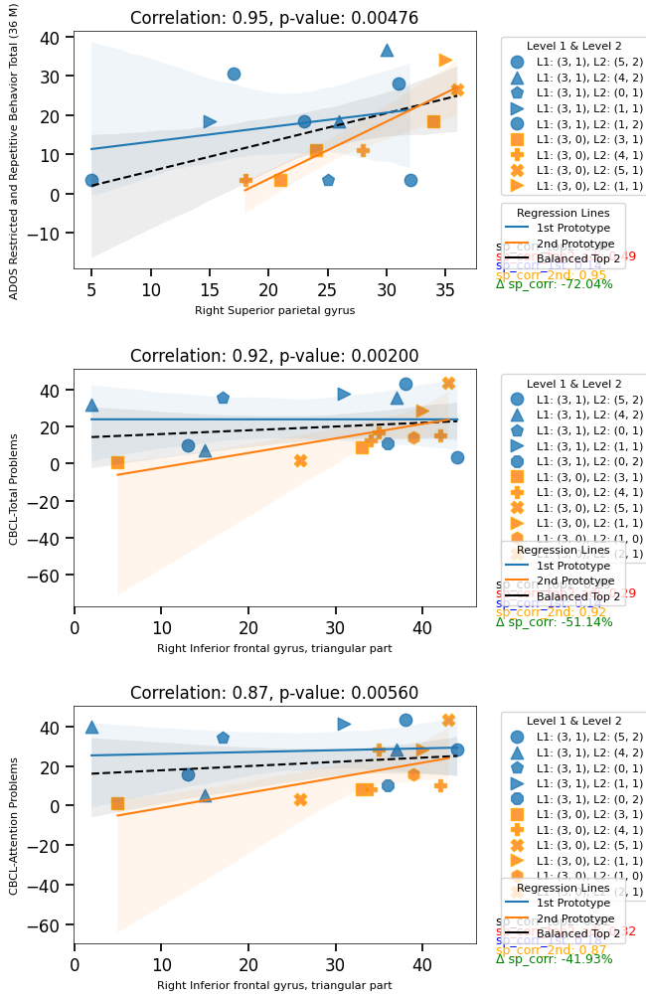

In [81]:
from matplotlib.lines import Line2D
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import spearmanr, rankdata

# Parameters: Adjust the number of top correlations to plot
top_n = 3 if total_combinations > 3 else total_combinations  # Adjust this to change the number of scatter plots

# Filter significant correlations from the matrix `mmt`
significant_pairs = mmt_prt_2.stack(dropna=True).reset_index()
significant_pairs.columns = ['Behavior', 'ROI', 'Correlation']

# Sort by absolute correlation values
significant_pairs['abs_corr'] = significant_pairs['Correlation'].abs()
sorted_pairs = significant_pairs.sort_values(by='abs_corr', ascending=False)

# Total number of significant correlations
total_combinations = len(sorted_pairs)
print(f"Total number of significant correlations: {total_combinations}")

# Retrieve p-values corresponding to the sorted correlation pairs
sorted_pairs['p_value'] = [pmatrix_prt_2.loc[b, r] for b, r in zip(sorted_pairs['Behavior'], sorted_pairs['ROI'])]

# Get the top N correlations
top_pairs = sorted_pairs.head(top_n)

# Updated marker list with 15 unique options
markers = ['o', 's', '^', 'D', 'P', 'X', 'v', '*', 'p', '<', '>', 'h', 'H', 'd', '8']

# Parse the Position List into Level 1 and Level 2
def parse_position_list(position_list_str):
    eval_list = eval(position_list_str)  # Convert string to list of tuples
    return eval_list[0], eval_list[1] if len(eval_list) > 1 else (None, None)

# Add hierarchy information from ds_prototypes_hier to dssamples
asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))
hierarchy_info = asd_prototypes_hier[['Identifier', 'Level 1', 'Level 2', 'Position List', 'BMU Distance']]
rowdf = pd.merge(datadf_asd_prototypes, hierarchy_info, left_on='ID', right_on='Identifier', how='left')

# Sort Level 1 and Level 2 based on their counts
level1_counts = rowdf['Level 1'].value_counts()
level2_counts = rowdf['Level 2'].value_counts()

# Sort by count and reorder
rowdf['Level 1'] = pd.Categorical(rowdf['Level 1'], categories=level1_counts.index, ordered=True)
rowdf['Level 2'] = pd.Categorical(rowdf['Level 2'], categories=level2_counts.index, ordered=True)

# Assign colors for Level 1 and markers for Level 2
palette = sns.color_palette("tab10", n_colors=10)
level1_colors = {level1: palette[i % len(palette)] for i, level1 in enumerate(level1_counts.index)}
level2_markers = {level2: markers[i % len(markers)] for i, level2 in enumerate(level2_counts.index)}

# Plot each pair in separate scatter plots (vertically)
fig, axes = plt.subplots(top_n, 1, figsize=(7, 3.5 * top_n))
if top_n == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one plot

for ax, row in zip(axes, top_pairs.itertuples(index=False)):
    behavior, roi, corr, p_value = row.Behavior, row.ROI, row.Correlation, row.p_value

    # Prepare the data for the scatter plot
    pair_df = rowdf.copy()
    m = pair_df[behavior] > -1
    pair_df = pair_df[m]
    pair_df[[roi, behavior]] = pair_df[[roi, behavior]].apply(rankdata)

    # Identify the biggest 2 prototypes
    top_level1_values = pair_df['Level 1'].value_counts().head(2).index
    blue_samples = pair_df[pair_df['Level 1'] == top_level1_values[0]]
    orange_samples = pair_df[pair_df['Level 1'] == top_level1_values[1]]

    # Combine the two biggest prototypes for sp_corr_top2
    top2_samples = pd.concat([blue_samples, orange_samples])

    # Oversample orange samples to match the size of blue samples
    oversampled_orange_samples = pd.concat([orange_samples, orange_samples.sample(n=len(blue_samples) - len(orange_samples), replace=True)])
    balanced_samples = pd.concat([blue_samples, oversampled_orange_samples])

    # Plot with hierarchy-based colors and markers
    scatter_handles = []
    level_1_prototype = 0
    for level1 in level1_counts.index:
        level_1_prototype += 1
        subset = pair_df[pair_df['Level 1'] == level1]
        for level2 in level2_counts.index:
            sub_subset = subset[subset['Level 2'] == level2]
            if sub_subset.empty:
                continue
            # Highlight the biggest prototype
            edgecolor = 'tab:blue' if level1 == top_level1_values[0] else ('orange' if level1 == top_level1_values[1] else None)
            scatter = ax.scatter(
                sub_subset[roi],
                sub_subset[behavior],
                label=f"L1: {level1}, L2: {level2}",
                color=level1_colors[level1],
                marker=level2_markers[level2],
                s=80,
                alpha=0.8,
                edgecolor=edgecolor
            )
            scatter_handles.append(scatter)

            # # Annotate BMU distances
            # for _, point in sub_subset.iterrows():
            #     ax.text(
            #         point[roi],
            #         point[behavior] + 0.7,  # Adjust offset for clarity
            #         f"{point['BMU Distance']:.2f}",
            #         fontsize=6,
            #         ha='center',
            #         va='bottom',
            #         bbox=dict(boxstyle="round,pad=0.2", edgecolor='gray', facecolor='white', alpha=0.7)
            #     )
        if level_1_prototype == 2:
            break
    # Add regression lines
    #sns.regplot(x=roi, y=behavior, data=pair_df, scatter=False, color='black', ax=ax, line_kws={"linestyle": "--"}, truncate=True, ci=None)
    sns.regplot(x=roi, y=behavior, data=balanced_samples, scatter=False, color='black', ax=ax, line_kws={"linestyle": "--", 'linewidth': 1.5}, truncate=True)
    sns.regplot(x=roi, y=behavior, data=blue_samples, scatter=False, color='tab:blue', ax=ax, line_kws={"linestyle": "-", 'linewidth': 1.5}, truncate=True)
    sns.regplot(x=roi, y=behavior, data=orange_samples, scatter=False, color='tab:orange', ax=ax, line_kws={"linestyle": "-", 'linewidth': 1.5}, truncate=True)
    # Adjust confidence interval transparency
    if ax.collections:  # Ensure the confidence interval exists
        ax.collections[-1].set_alpha(0.07)  # Lower alpha to fade confidence
        ax.collections[-2].set_alpha(0.07)  # Lower alpha to fade confidence
        ax.collections[-3].set_alpha(0.07)  # Lower alpha to fade confidence

    # Calculate correlations
    sp_corr_blue, _ = spearmanr(blue_samples[roi], blue_samples[behavior])
    sp_corr_orange, _ = spearmanr(orange_samples[roi], orange_samples[behavior])
    sp_corr_top2, _ = spearmanr(top2_samples[roi], top2_samples[behavior])  # Without oversampling
    sp_corr_top2_adj, _ = spearmanr(balanced_samples[roi], balanced_samples[behavior])  # With oversampling

    # Calculate delta_corr (percentage change)
    delta_corr = (sp_corr_blue - sp_corr_top2_adj) / sp_corr_top2_adj

    # Add correlation values to the plot
    ii = 0.12
    ll = 0.04
    # Add colored correlation values below regression legend
    #ax.text(1.05, ii, f"sp_corr: {corr:.2f}", transform=ax.transAxes, fontsize=9, color="black")
    ax.text(1.05, ii-ll, f"sp_corr_top2: {sp_corr_top2:.2f}", transform=ax.transAxes, fontsize=9, color="black")
    ax.text(1.05, ii-2*ll, f"sp_corr_top2_adj: {sp_corr_top2_adj:.2f}", transform=ax.transAxes, fontsize=9, color="red")
    ax.text(1.05, ii-3*ll, f"sp_corr_1st: {sp_corr_blue:.2f}", transform=ax.transAxes, fontsize=9, color="blue")
    ax.text(1.05, ii-4*ll, f"sp_corr_2nd: {sp_corr_orange:.2f}", transform=ax.transAxes, fontsize=9, color="orange")
    ax.text(1.05, ii-5*ll, f"\u0394 sp_corr: {delta_corr:.2%}", transform=ax.transAxes, fontsize=9, color="green")

    # Add scatter legend
    scatter_legend = ax.legend(
        handles=scatter_handles,
        title="Level 1 & Level 2",
        title_fontsize=8,  # Match font size with legend text
        bbox_to_anchor=(1.05, 1),
        loc='upper left',
        fontsize=8
    )
    ax.add_artist(scatter_legend)

    # Add regression legend
    reg_legend_handles = [
        #Line2D([0], [0], color='black', linestyle="--", label="All Samples"),
        Line2D([0], [0], color='tab:blue', linestyle="-", label="1st Prototype"),
        Line2D([0], [0], color='tab:orange', linestyle="-", label="2nd Prototype"),
        Line2D([0], [0], color='black', linestyle="-", label="Balanced Top 2")
    ]
    ax.legend(
        handles=reg_legend_handles,
        title="Regression Lines",
        title_fontsize=8,  # Match font size with legend text
        bbox_to_anchor=(1.05, 0.3),
        loc='upper left',
        fontsize=8
    )

    # Add title
    #ax.set_title(f"ROI: {roi}, Behavior: {behavior_column_map[behavior]}, Corr: {corr:.2f}", fontsize=12)
    ax.set_title(f"Correlation: {corr:.2f}, p-value: {p_value:.5f}", fontsize=12)

    # Adjust font size for x and y labels
    ax.set_xlabel(roi, fontsize=8)
    ax.set_ylabel(behavior_column_map[behavior], fontsize=8)

    # Adjust tick label size
    ax.tick_params(axis='both', which='major', labelsize=12)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)

print("Total",len(asd_prototypes_hier))
print("1st prototype",len(blue_samples))
print("2nd prototype",len(orange_samples))

# Adjust layout and show the plots
plt.tight_layout()
plt.subplots_adjust()
plt.show()
#plt.savefig("fig_result_asd_proto_2.pdf")
## sss

/tmp/ipykernel_466416/3674798801.py:11: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  significant_pairs = mmt_prt_1.stack(dropna=True).reset_index()
/tmp/ipykernel_466416/3674798801.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))


Total number of significant correlations: 19
Total 54
1st prototype 14
2nd prototype 12


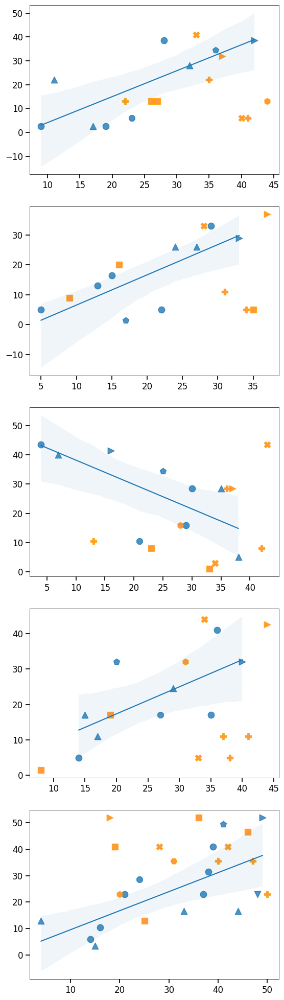

In [82]:
from matplotlib.lines import Line2D
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import spearmanr, rankdata

# Parameters: Adjust the number of top correlations to plot
top_n = 5 if total_combinations > 5 else total_combinations  # Adjust this to change the number of scatter plots

# Filter significant correlations from the matrix `mmt`
significant_pairs = mmt_prt_1.stack(dropna=True).reset_index()
significant_pairs.columns = ['Behavior', 'ROI', 'Correlation']

# Sort by absolute correlation values
significant_pairs['abs_corr'] = significant_pairs['Correlation'].abs()
sorted_pairs = significant_pairs.sort_values(by='abs_corr', ascending=False)

# Total number of significant correlations
total_combinations = len(sorted_pairs)
print(f"Total number of significant correlations: {total_combinations}")

# Retrieve p-values corresponding to the sorted correlation pairs
sorted_pairs['p_value'] = [pmatrix_prt_1.loc[b, r] for b, r in zip(sorted_pairs['Behavior'], sorted_pairs['ROI'])]

# Get the top N correlations
top_pairs = sorted_pairs.head(top_n)

# Updated marker list with 15 unique options
markers = ['o', 's', '^', 'D', 'P', 'X', 'v', '*', 'p', '<', '>', 'h', 'H', 'd', '8']

# Parse the Position List into Level 1 and Level 2
def parse_position_list(position_list_str):
    eval_list = eval(position_list_str)  # Convert string to list of tuples
    return eval_list[0], eval_list[1] if len(eval_list) > 1 else (None, None)

# Add hierarchy information from ds_prototypes_hier to dssamples
asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))
hierarchy_info = asd_prototypes_hier[['Identifier', 'Level 1', 'Level 2', 'Position List', 'BMU Distance']]
rowdf = pd.merge(datadf_asd_prototypes, hierarchy_info, left_on='ID', right_on='Identifier', how='left')

# Sort Level 1 and Level 2 based on their counts
level1_counts = rowdf['Level 1'].value_counts()
level2_counts = rowdf['Level 2'].value_counts()

# Sort by count and reorder
rowdf['Level 1'] = pd.Categorical(rowdf['Level 1'], categories=level1_counts.index, ordered=True)
rowdf['Level 2'] = pd.Categorical(rowdf['Level 2'], categories=level2_counts.index, ordered=True)

# Assign colors for Level 1 and markers for Level 2
palette = sns.color_palette("tab10", n_colors=10)
level1_colors = {level1: palette[i % len(palette)] for i, level1 in enumerate(level1_counts.index)}
level2_markers = {level2: markers[i % len(markers)] for i, level2 in enumerate(level2_counts.index)}

# Plot each pair in separate scatter plots (vertically)
fig, axes = plt.subplots(top_n, 1, figsize=(6, 4 * top_n))
if top_n == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one plot

for ax, row in zip(axes, top_pairs.itertuples(index=False)):
    behavior, roi, corr, p_value = row.Behavior, row.ROI, row.Correlation, row.p_value

    # Prepare the data for the scatter plot
    pair_df = rowdf.copy()
    m = pair_df[behavior] > -1
    pair_df = pair_df[m]
    pair_df[[roi, behavior]] = pair_df[[roi, behavior]].apply(rankdata)

    # Identify the biggest 2 prototypes
    top_level1_values = pair_df['Level 1'].value_counts().head(2).index
    blue_samples = pair_df[pair_df['Level 1'] == top_level1_values[0]]
    orange_samples = pair_df[pair_df['Level 1'] == top_level1_values[1]]

    # Combine the two biggest prototypes for sp_corr_top2
    top2_samples = pd.concat([blue_samples, orange_samples])

    # Oversample orange samples to match the size of blue samples
    oversampled_orange_samples = pd.concat([orange_samples, orange_samples.sample(n=len(blue_samples) - len(orange_samples), replace=True)])
    balanced_samples = pd.concat([blue_samples, oversampled_orange_samples])

    # Plot with hierarchy-based colors and markers
    scatter_handles = []
    level_1_prototype = 0
    for level1 in level1_counts.index:
        level_1_prototype += 1
        subset = pair_df[pair_df['Level 1'] == level1]
        for level2 in level2_counts.index:
            sub_subset = subset[subset['Level 2'] == level2]
            if sub_subset.empty:
                continue
            # Highlight the biggest prototype
            edgecolor = 'tab:blue' if level1 == top_level1_values[0] else ('orange' if level1 == top_level1_values[1] else None)
            scatter = ax.scatter(
                sub_subset[roi],
                sub_subset[behavior],
                label=f"L1: {level1}, L2: {level2}",
                color=level1_colors[level1],
                marker=level2_markers[level2],
                s=80,
                alpha=0.8,
                edgecolor=edgecolor
            )
            scatter_handles.append(scatter)
        if level_1_prototype == 2:
            break

    sns.regplot(x=roi, y=behavior, data=blue_samples, scatter=False, color='tab:blue', ax=ax, line_kws={"linestyle": "-", 'linewidth': 1.5}, truncate=True)

    # Adjust confidence interval transparency
    if ax.collections:  # Ensure the confidence interval exists
        ax.collections[-1].set_alpha(0.07)  # Lower alpha to fade confidence
        # ax.collections[-2].set_alpha(0.07)  # Lower alpha to fade confidence
        # ax.collections[-3].set_alpha(0.07)  # Lower alpha to fade confidence

    # Calculate correlations
    sp_corr_blue, _ = spearmanr(blue_samples[roi], blue_samples[behavior])
    sp_corr_orange, _ = spearmanr(orange_samples[roi], orange_samples[behavior])
    sp_corr_top2, _ = spearmanr(top2_samples[roi], top2_samples[behavior])  # Without oversampling
    sp_corr_top2_adj, _ = spearmanr(balanced_samples[roi], balanced_samples[behavior])  # With oversampling

    # Calculate delta_corr (percentage change)
    delta_corr = (sp_corr_blue - sp_corr_top2_adj) / sp_corr_top2_adj

    # Add correlation values to the plot
    ii = 0.12
    ll = 0.04
    ax.set_xlabel(None)
    ax.set_ylabel(None)


    # Adjust tick label size
    ax.tick_params(axis='both', which='major', labelsize=12)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)

print("Total",len(asd_prototypes_hier))
print("1st prototype",len(blue_samples))
print("2nd prototype",len(orange_samples))

# Adjust layout and show the plots
plt.tight_layout()
plt.subplots_adjust()
#plt.savefig("fig_result_asd_proto_1.pdf")
plt.show()


/tmp/ipykernel_466416/1474014463.py:11: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  significant_pairs = mmt_prt_2.stack(dropna=True).reset_index()
/tmp/ipykernel_466416/1474014463.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))


Total number of significant correlations: 19
Total 54
1st prototype 9
2nd prototype 7


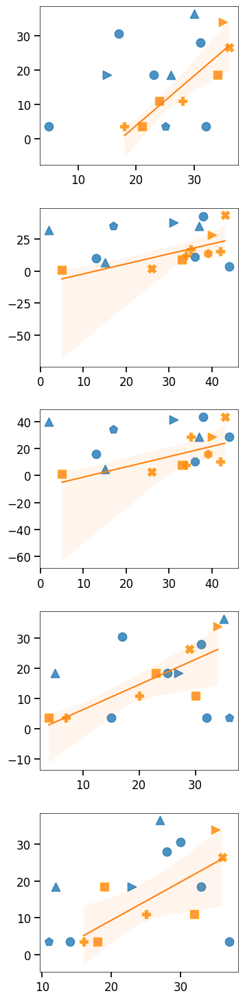

In [83]:
from matplotlib.lines import Line2D
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import spearmanr, rankdata

# Parameters: Adjust the number of top correlations to plot
top_n = 5 if total_combinations > 5 else total_combinations  # Adjust this to change the number of scatter plots

# Filter significant correlations from the matrix `mmt`
significant_pairs = mmt_prt_2.stack(dropna=True).reset_index()
significant_pairs.columns = ['Behavior', 'ROI', 'Correlation']

# Sort by absolute correlation values
significant_pairs['abs_corr'] = significant_pairs['Correlation'].abs()
sorted_pairs = significant_pairs.sort_values(by='abs_corr', ascending=False)

# Total number of significant correlations
total_combinations = len(sorted_pairs)
print(f"Total number of significant correlations: {total_combinations}")

# Retrieve p-values corresponding to the sorted correlation pairs
sorted_pairs['p_value'] = [pmatrix_prt_2.loc[b, r] for b, r in zip(sorted_pairs['Behavior'], sorted_pairs['ROI'])]

# Get the top N correlations
top_pairs = sorted_pairs.head(top_n)

# Updated marker list with 15 unique options
markers = ['o', 's', '^', 'D', 'P', 'X', 'v', '*', 'p', '<', '>', 'h', 'H', 'd', '8']

# Parse the Position List into Level 1 and Level 2
def parse_position_list(position_list_str):
    eval_list = eval(position_list_str)  # Convert string to list of tuples
    return eval_list[0], eval_list[1] if len(eval_list) > 1 else (None, None)

# Add hierarchy information from ds_prototypes_hier to dssamples
asd_prototypes_hier['Level 1'], asd_prototypes_hier['Level 2'] = zip(*asd_prototypes_hier['Position List'].apply(parse_position_list))
hierarchy_info = asd_prototypes_hier[['Identifier', 'Level 1', 'Level 2', 'Position List', 'BMU Distance']]
rowdf = pd.merge(datadf_asd_prototypes, hierarchy_info, left_on='ID', right_on='Identifier', how='left')

# Sort Level 1 and Level 2 based on their counts
level1_counts = rowdf['Level 1'].value_counts()
level2_counts = rowdf['Level 2'].value_counts()

# Sort by count and reorder
rowdf['Level 1'] = pd.Categorical(rowdf['Level 1'], categories=level1_counts.index, ordered=True)
rowdf['Level 2'] = pd.Categorical(rowdf['Level 2'], categories=level2_counts.index, ordered=True)

# Assign colors for Level 1 and markers for Level 2
palette = sns.color_palette("tab10", n_colors=10)
level1_colors = {level1: palette[i % len(palette)] for i, level1 in enumerate(level1_counts.index)}
level2_markers = {level2: markers[i % len(markers)] for i, level2 in enumerate(level2_counts.index)}

# Plot each pair in separate scatter plots (vertically)
fig, axes = plt.subplots(top_n, 1, figsize=(4, 3 * top_n))
if top_n == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one plot

for ax, row in zip(axes, top_pairs.itertuples(index=False)):
    behavior, roi, corr, p_value = row.Behavior, row.ROI, row.Correlation, row.p_value

    # Prepare the data for the scatter plot
    pair_df = rowdf.copy()
    m = pair_df[behavior] > -1
    pair_df = pair_df[m]
    pair_df[[roi, behavior]] = pair_df[[roi, behavior]].apply(rankdata)

    # Identify the biggest 2 prototypes
    top_level1_values = pair_df['Level 1'].value_counts().head(2).index
    blue_samples = pair_df[pair_df['Level 1'] == top_level1_values[0]]
    orange_samples = pair_df[pair_df['Level 1'] == top_level1_values[1]]

    # Combine the two biggest prototypes for sp_corr_top2
    top2_samples = pd.concat([blue_samples, orange_samples])

    # Oversample orange samples to match the size of blue samples
    oversampled_orange_samples = pd.concat([orange_samples, orange_samples.sample(n=len(blue_samples) - len(orange_samples), replace=True)])
    balanced_samples = pd.concat([blue_samples, oversampled_orange_samples])

    # Plot with hierarchy-based colors and markers
    scatter_handles = []
    level_1_prototype = 0
    for level1 in level1_counts.index:
        level_1_prototype += 1
        subset = pair_df[pair_df['Level 1'] == level1]
        for level2 in level2_counts.index:
            sub_subset = subset[subset['Level 2'] == level2]
            if sub_subset.empty:
                continue
            # Highlight the biggest prototype
            edgecolor = 'tab:blue' if level1 == top_level1_values[0] else ('orange' if level1 == top_level1_values[1] else None)
            scatter = ax.scatter(
                sub_subset[roi],
                sub_subset[behavior],
                label=f"L1: {level1}, L2: {level2}",
                color=level1_colors[level1],
                marker=level2_markers[level2],
                s=80,
                alpha=0.8,
                edgecolor=edgecolor
            )
            scatter_handles.append(scatter)

        if level_1_prototype == 2:
            break
    # Add regression lines

    sns.regplot(x=roi, y=behavior, data=orange_samples, scatter=False, color='tab:orange', ax=ax, line_kws={"linestyle": "-", 'linewidth': 1.5}, truncate=True)
    # Adjust confidence interval transparency
    if ax.collections:  # Ensure the confidence interval exists
        ax.collections[-1].set_alpha(0.07)  # Lower alpha to fade confidence

    # Calculate correlations
    sp_corr_blue, _ = spearmanr(blue_samples[roi], blue_samples[behavior])
    sp_corr_orange, _ = spearmanr(orange_samples[roi], orange_samples[behavior])
    sp_corr_top2, _ = spearmanr(top2_samples[roi], top2_samples[behavior])  # Without oversampling
    sp_corr_top2_adj, _ = spearmanr(balanced_samples[roi], balanced_samples[behavior])  # With oversampling

    # Calculate delta_corr (percentage change)
    delta_corr = (sp_corr_blue - sp_corr_top2_adj) / sp_corr_top2_adj

    # Add correlation values to the plot
    ii = 0.12
    ll = 0.04
    ax.set_xlabel(None)
    ax.set_ylabel(None)

    # Adjust tick label size
    ax.tick_params(axis='both', which='major', labelsize=12)
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)

print("Total",len(asd_prototypes_hier))
print("1st prototype",len(blue_samples))
print("2nd prototype",len(orange_samples))

# Adjust layout and show the plots
plt.tight_layout()
plt.subplots_adjust()
#plt.savefig("fig_result_asd_proto_2.pdf")
plt.show()


In [84]:
# Get the Level 1 values for the biggest and second biggest prototypes
biggest_prototype_level1 = top_level1_values[0]
second_biggest_prototype_level1 = top_level1_values[1]

# Filter the top2_samples DataFrame to get the samples belonging to the biggest and second biggest prototypes
biggest_prototype_samples = top2_samples[top2_samples['Level 1'] == biggest_prototype_level1]
second_biggest_prototype_samples = top2_samples[top2_samples['Level 1'] == second_biggest_prototype_level1]

# Get the identifiers for the biggest and second biggest prototype samples
biggest_prototype_identifiers = biggest_prototype_samples['Identifier'].tolist()
second_biggest_prototype_identifiers = second_biggest_prototype_samples['Identifier'].tolist()

print("Biggest Prototype Identifiers:", biggest_prototype_identifiers)
print("Second Biggest Prototype Identifiers:", second_biggest_prototype_identifiers)

Biggest Prototype Identifiers: ['IBIS108131', 'IBIS174982', 'IBIS230955', 'IBIS241033', 'IBIS439857', 'IBIS447754', 'IBIS463809', 'IBIS603076', 'IBIS983222']
Second Biggest Prototype Identifiers: ['IBIS336576', 'IBIS373485', 'IBIS389101', 'IBIS490878', 'IBIS569748', 'IBIS841812', 'IBIS931343']


Total number of significant correlations: 19


/tmp/ipykernel_466416/3830354686.py:11: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  significant_pairs = mmt_prt_1.stack(dropna=True).reset_index()


Total 54
1st prototype 9
2nd prototype 7


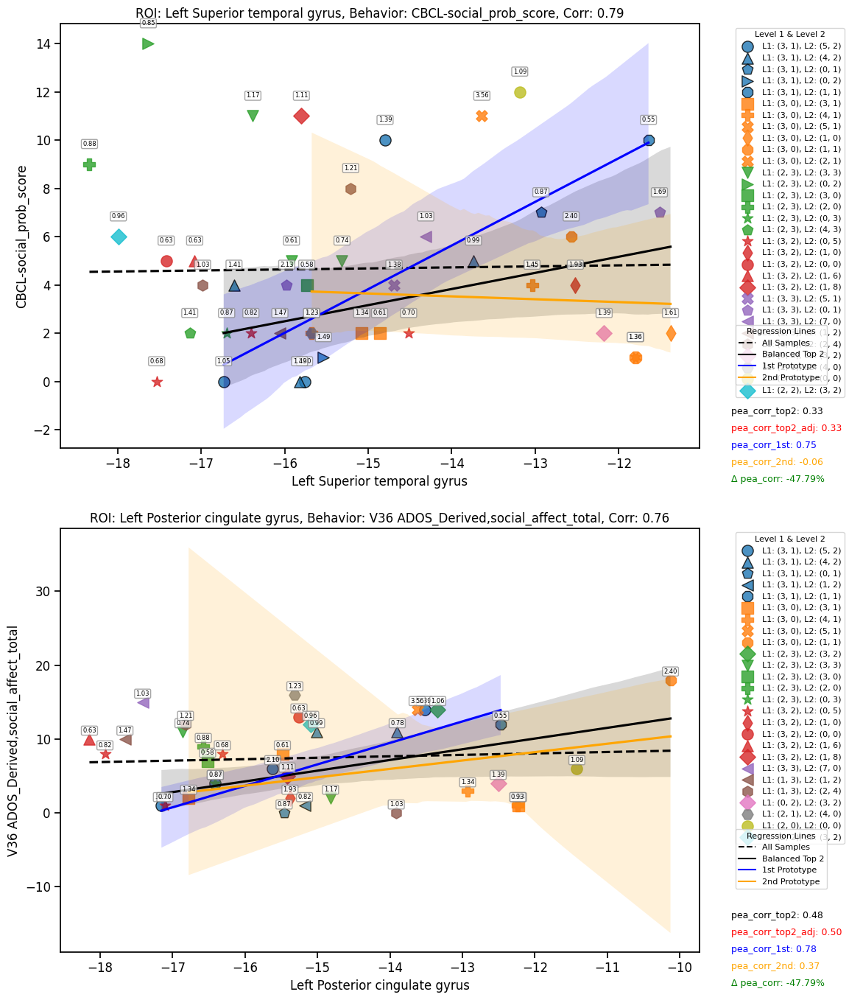

In [85]:
from matplotlib.lines import Line2D
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import pearsonr, rankdata

# Parameters: Adjust the number of top correlations to plot
top_n = 2 if total_combinations > 3 else total_combinations  # Adjust this to change the number of scatter plots

# Filter significant correlations from the matrix `mmt`
significant_pairs = mmt_prt_1.stack(dropna=True).reset_index()
significant_pairs.columns = ['Behavior', 'ROI', 'Correlation']

# Sort by absolute correlation values
significant_pairs['abs_corr'] = significant_pairs['Correlation'].abs()
sorted_pairs = significant_pairs.sort_values(by='abs_corr', ascending=False)

# Total number of significant correlations
total_combinations = len(sorted_pairs)
print(f"Total number of significant correlations: {total_combinations}")

# Get the top N correlations
top_pairs = sorted_pairs.head(top_n)


# Define a unique set of markers
markers = ['o', 's', '^', 'D', 'P', 'X', 'v', '*', 'p', '<', '>', 'h', 'H', 'd', '8']

# Sort Level 1 and Level 2 based on their counts
level1_counts = rowdf['Level 1'].value_counts()
level2_counts = rowdf['Level 2'].value_counts()

# Assign colors for Level 1 and markers for Level 2
palette = sns.color_palette("tab10", n_colors=10)
level1_colors = {level1: palette[i % len(palette)] for i, level1 in enumerate(level1_counts.index)}
level2_markers = {level2: markers[i % len(markers)] for i, level2 in enumerate(level2_counts.index)}

# Plot each pair in separate scatter plots (vertically)
fig, axes = plt.subplots(top_n, 1, figsize=(12, 7 * top_n))
if top_n == 1:
    axes = [axes]  # Ensure axes is iterable if there's only one plot

for ax, row in zip(axes, top_pairs.itertuples(index=False)):
    behavior, roi, corr = row.Behavior, row.ROI, row.Correlation

    # Prepare the data for the scatter plot
    pair_df = rowdf.copy()
    m = pair_df[behavior] > -1
    pair_df = pair_df[m]

    # Identify the biggest 2 prototypes
    top_level1_values = pair_df['Level 1'].value_counts().head(2).index
    blue_samples = pair_df[pair_df['Level 1'] == top_level1_values[0]]
    orange_samples = pair_df[pair_df['Level 1'] == top_level1_values[1]]

    # Combine the two biggest prototypes for sp_corr_top2
    top2_samples = pd.concat([blue_samples, orange_samples])

    # Oversample orange samples to match the size of blue samples
    oversampled_orange_samples = pd.concat(
        [orange_samples, orange_samples.sample(n=len(blue_samples) - len(orange_samples), replace=True)]
    )
    balanced_samples = pd.concat([blue_samples, oversampled_orange_samples])

    # Plot with hierarchy-based colors and markers
    scatter_handles = []
    for level1 in level1_counts.index:
        subset = pair_df[pair_df['Level 1'] == level1]
        for level2 in level2_counts.index:
            sub_subset = subset[subset['Level 2'] == level2]
            if sub_subset.empty:
                continue
            edgecolor = 'black' if level1 == top_level1_values[0] else None
            scatter = ax.scatter(
                sub_subset[roi],
                sub_subset[behavior],
                label=f"L1: {level1}, L2: {level2}",
                color=level1_colors[level1],
                marker=level2_markers[level2],
                s=120,
                alpha=0.8,
                edgecolor=edgecolor
            )
            scatter_handles.append(scatter)

            # Annotate BMU distances
            for _, point in sub_subset.iterrows():
                ax.text(
                    point[roi],
                    point[behavior] + 0.7,  # Adjust offset for clarity
                    f"{point['BMU Distance']:.2f}",
                    fontsize=6,
                    ha='center',
                    va='bottom',
                    bbox=dict(boxstyle="round,pad=0.2", edgecolor='gray', facecolor='white', alpha=0.7)
                )

    # Add regression lines
    sns.regplot(x=roi, y=behavior, data=pair_df, scatter=False, color='black', ax=ax, line_kws={"linestyle": "--"}, truncate=True, ci=None)
    sns.regplot(x=roi, y=behavior, data=balanced_samples, scatter=False, color='black', ax=ax, line_kws={"linestyle": "-"}, truncate=True)
    sns.regplot(x=roi, y=behavior, data=blue_samples, scatter=False, color='blue', ax=ax, line_kws={"linestyle": "-"}, truncate=True)
    sns.regplot(x=roi, y=behavior, data=orange_samples, scatter=False, color='orange', ax=ax, line_kws={"linestyle": "-"}, truncate=True)

    # Pearson correlations
    pea_corr_blue, _ = pearsonr(blue_samples[roi], blue_samples[behavior])
    pea_corr_orange, _ = pearsonr(orange_samples[roi], orange_samples[behavior])
    pea_corr_top2, _ = pearsonr(top2_samples[roi], top2_samples[behavior])
    pea_corr_top2_adj, _ = pearsonr(balanced_samples[roi], balanced_samples[behavior])
    delta_corr_pea = (pea_corr_blue - pea_corr_top2_adj) / pea_corr_top2_adj

    # Add correlation values to the plot
    ii = 0.12
    ll = 0.04
    # Add colored correlation values below regression legend
    #ax.text(1.05, ii, f"sp_corr: {corr:.2f}", transform=ax.transAxes, fontsize=9, color="black")
    ax.text(1.05, ii-ll, f"pea_corr_top2: {pea_corr_top2:.2f}", transform=ax.transAxes, fontsize=9, color="black")
    ax.text(1.05, ii-2*ll, f"pea_corr_top2_adj: {pea_corr_top2_adj:.2f}", transform=ax.transAxes, fontsize=9, color="red")
    ax.text(1.05, ii-3*ll, f"pea_corr_1st: {pea_corr_blue:.2f}", transform=ax.transAxes, fontsize=9, color="blue")
    ax.text(1.05, ii-4*ll, f"pea_corr_2nd: {pea_corr_orange:.2f}", transform=ax.transAxes, fontsize=9, color="orange")
    ax.text(1.05, ii-5*ll, f"\u0394 pea_corr: {delta_corr:.2%}", transform=ax.transAxes, fontsize=9, color="green")

    # Add legend for scatter plots
    scatter_legend = ax.legend(
        handles=scatter_handles,
        title="Level 1 & Level 2",
        title_fontsize=8,
        bbox_to_anchor=(1.05, 1),
        loc='upper left',
        fontsize=8
    )
    ax.add_artist(scatter_legend)

    # Add legend for regression lines
    reg_legend_handles = [
        Line2D([0], [0], color='black', linestyle="--", label="All Samples"),
        Line2D([0], [0], color='black', linestyle="-", label="Balanced Top 2"),
        Line2D([0], [0], color='blue', linestyle="-", label="1st Prototype"),
        Line2D([0], [0], color='orange', linestyle="-", label="2nd Prototype"),
    ]
    ax.legend(
        handles=reg_legend_handles,
        title="Regression Lines",
        title_fontsize=8,
        bbox_to_anchor=(1.05, 0.3),
        loc='upper left',
        fontsize=8
    )

    # Add title and labels
    ax.set_title(f"ROI: {roi}, Behavior: {behavior}, Corr: {corr:.2f}", fontsize=12)
    ax.set_xlabel(roi, fontsize=12)
    ax.set_ylabel(behavior, fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12)

print("Total",len(asd_prototypes_hier))
print("1st prototype",len(blue_samples))
print("2nd prototype",len(orange_samples))

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

In [86]:
def get_sorted_pairs(mmt_prt: pd.DataFrame, pmatrix_prt: pd.DataFrame, corrected_pmatrix_prt: pd.DataFrame) -> pd.DataFrame:
    """
    Returns a DataFrame of all non-NA correlations from mmt_prt,
    sorted by absolute value, and with corresponding p-values.
    
    Parameters
    ----------
    mmt_prt : DataFrame
        Correlation matrix (behaviors × ROIs).
    pmatrix_prt : DataFrame
        Matching p-value matrix (behaviors × ROIs).
    
    Returns
    -------
    DataFrame with columns:
      - Behavior:  behavior name
      - ROI:       region of interest name
      - Correlation
      - p_value
    """
    # 1. Stack to long form and drop NA correlations
    sig = mmt_prt.stack(future_stack=True).reset_index()
    sig.columns = ['Behavior', 'ROI', 'Correlation']
    sig = sig.dropna(subset=['Correlation'])
    
    # 2. Add absolute value for sorting
    sig['abs_corr'] = sig['Correlation'].abs()

    # 3. Lookup p-values
    sig['p_value'] = sig.apply(
        lambda row: pmatrix_prt.loc[row['Behavior'], row['ROI']],
        axis=1
    )
    
    sig['adjusted-p'] = sig.apply(
    lambda row: corrected_pmatrix_prt.loc[row['Behavior'], row['ROI']],
    axis=1
    )
    # 4. Sort by absolute correlation and drop helper column
    out = sig.sort_values('abs_corr', ascending=False).drop(columns='abs_corr')

    # 5. (Optional) reset index if you like
    return out.reset_index(drop=True)

In [87]:
get_sorted_pairs(mmt_prt_1, pmatrix_prt_1, corrected_pmatrix_prt_1)

,Behavior,ROI,Correlation,p_value,adjusted-p
0,CBCL-social_prob_score,Left Superior temporal gyrus,0.791669,0.015198,0.852635
1,"V36 ADOS_Derived,social_affect_total",Left Posterior cingulate gyrus,0.764733,0.023398,0.852635
2,CBCL-attention_prob_score,Right Lobule VI of cerebellar hemisphere,-0.761513,0.024398,0.852635
3,CBCL-thought_prob_score,Left Posterior cingulate gyrus,0.740593,0.027597,0.852635
4,"V24 ADOS_Derived,social_affect_total",Right Insula,0.733713,0.004200,0.852635
5,"V36 ADOS_Derived,social_affect_total",Right Superior temporal gyrus,0.714311,0.034997,0.852635
6,"V36 ADOS_Derived,restricted_repetitive_behavio...",Right Superior temporal gyrus,0.707317,0.040796,0.852635
7,CBCL-total_problems_score,Left Posterior cingulate gyrus,0.702935,0.044596,0.852635
8,CBCL-social_prob_score,Right Superior temporal gyrus,0.698030,0.046195,0.852635
9,CBCL-total_problems_score,Left Superior temporal gyrus,0.694567,0.045395,0.852635


In [88]:
get_sorted_pairs(mmt_prt_2, pmatrix_prt_2, corrected_pmatrix_prt_2)

,Behavior,ROI,Correlation,p_value,adjusted-p
0,"V36 ADOS_Derived,restricted_repetitive_behavio...",Right Superior parietal gyrus,0.945611,0.004762,0.698064
1,CBCL-total_problems_score,"Right Inferior frontal gyrus, triangular part",0.916667,0.002000,0.698064
2,CBCL-attention_prob_score,"Right Inferior frontal gyrus, triangular part",0.865577,0.005599,0.698064
3,"V36 ADOS_Derived,restricted_repetitive_behavio...",Left Thalamus,0.836502,0.028571,0.882665
4,"V36 ADOS_Derived,restricted_repetitive_behavio...","Left Superior frontal gyrus, dorsolateral",0.836502,0.028571,0.882665
5,CBCL-internalizing_score,"Right Inferior frontal gyrus, triangular part",0.813676,0.009599,0.882665
6,CBCL-externalizing_score,"Right Inferior frontal gyrus, triangular part",0.800000,0.015398,0.882665
7,CBCL-thought_prob_score,Right Crus II of cerebellar hemisphere,0.756329,0.021398,0.882665
8,CBCL-thought_prob_score,Right Crus I of cerebellar hemisphere,0.747926,0.022798,0.882665
9,CBCL-attention_prob_score,Right Middle frontal gyrus,0.714311,0.039196,0.882665
